## Setup

1. Data. Cropped cells: 66x66 pixel size (2-3 times size of a typical cell), merged into 3-channel:  
Brighfield: 'chan_0.tiff' --> signal from transmitted light  
DAPI: 'chan_3.tiff' --> fluo. signal used for nucleus segmentation  
Cy5: 'chan_4.tiff' --> fluo. signal used for cytoplasm segmentation  
![alt tag](../images/crop.png)

Crop 48, contained cells 6.237322976409229, standard deviation 2.2656130656212894  
Crop 56, contained cells 7.377497100744454, standard deviation 2.730966788903181  
Crop 100, contained cells 15.289026403446222, standard deviation 6.427442132691482  
Crop 128, contained cells 21.6591683331491, standard deviation 9.600369991104865  

2. Countinous target. 2-channel, single value. Average over cell masks from raw data (intensity from Cells.csv was not used):  
Cy3: 'chan_1.tiff' --> fluorescence signal from FUCCI system (G1 phase)  
GFP: 'chan_2.tiff' --> fluo. signal from FUCCI system (S/G2/M phases)

3. Convolutional neural net. 2 outputs, equally weighted. Loss function MSE or MSLE. Trained for 14-50 epochs with SGD or Adam, batch size 32, learning rate 0.001 or 0.0001.

4. Extracted features: last layer (dimension 2) or global pooling layer (dimension 512)  
5. UMAP embbeddings with various metrics

## Preliminary resuls
1. Fluorescence intensity reconstruction error:  
	red channel 22.59% (14.28% std)  
	green channel 9.24% (24.71% std)

2. Cell cycle was not reconstructed as an elongated track. For 2-dimensional features it looks topologically equivalent to fluo. channels distribution in 2d space. There seems a reason for that: we regress the model output onto continuous variables in Cartesian space where they do not make a track a priory.

## Discussion
1. Reconstruction error looks fair and could be improved further with more data, different crop size and added morphlological features. Only 25% of data was used for training so far.  
2. If our goal is elongated cell path, here are couple proposals:  
-- to substitute continuous 2d target with something that resembles circle or track (in 1d ?)  
-- to try categorical targets

## New results as of 20.07.18
1. The shape of mapping is highly dependent of individual feature variance scaling. In general, Red channel std is ~7x greater than Green channel std and needs to be downscaled somehow aligned with Green variance. The following methods of variance scaling have been tried:  
    --normalize and downscale Red channel by factor of x5-8 (works well in regression framework). See 1.2  
    --whitening. See 1.3  
    --log transform (works in both frameworks). See 1.4, 2.2, 2.4  
    --make training data more extreme removing data with Red/Green intensities within +-0.5 std
    
2. Different crop sizes: 32, 48, 66, 98, 130, 180 pixels. Makes no difference neither in regression, nor in classification framework. Absolute percentage error of Red/Green prediction 20/10% See 1.1 Categorical accuracy - 30% for 16 class; 56% for 6 class; 58% for 4 class split.
3. Classification framework implemented. See 2. Split R/G intensity plane with 4x4 rectangular grid such that data is distributed uniformely across the grid. See 2.5 Assign each data point 1 of 16 catagorical labels. Train NN with categorical targets instead of continous targets.  
Use 16-dimensional softmax output as descriptors for UMAP/t-SNE mapping. Log transform of outputs improves mapping. See 2.2  
Notice that catagorical labels can be assigned arbitrary. For instance, radial structure can be enforced.

2.6 Angular projection

In [1]:
import numpy as np
import pickle
import pandas as pd

import umap
%matplotlib inline
import matplotlib as mpl
import matplotlib.cm as cm
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.colors as colors
import seaborn as sns
plt.style.use('_classic_test')

In [11]:
def thresh_fun(arr):
    #threshold function
    return np.mean(arr) - 0.5 * np.std(arr)

In [22]:
from scipy import linalg
def whitening(X):
    '''
    X :         N x d
    Xcont :     N x d
    xZCAWhite : N x d
    W :         d x d
    M :         1 x d
    '''    
    mean_ = np.mean(X, axis=0)
    var_ = np.var(X, axis=0, ddof=1)

    epsilon = 0
    Xcont = (X - mean_) / np.sqrt(var_+epsilon)

    ## Implement ZCA whitening
    sigma = np.cov(Xcont, rowvar=False)
    U, S, V = linalg.svd(sigma)

    epsilon = 0.0
    W = np.dot(np.dot(U, np.diag(1 / np.sqrt(S + epsilon))), U.T)
    M = np.mean(Xcont, axis=0, keepdims=True)
    xZCAWhite = np.dot(Xcont - M, W)

    return Xcont, xZCAWhite, W, M

In [2]:
def umap_transform(data, n_neighbors=15, min_dist=0.1, n_components=2, metric='euclidean'):
    fit = umap.UMAP(
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        n_components=n_components,
        metric=metric
    )
    embeddings = fit.fit_transform(data)        
    return embeddings


def umap_plot(embeddings, colors, n_components, hovertext=None, title='', colorbar=False, alpha=1.0, cmap="RdYlGn", linewidths=0):

    if n_components == 1:
        points = plt.scatter(embeddings, range(len(embeddings)), c=colors)
    if n_components == 2:
        points = plt.scatter(embeddings[:, 0], embeddings[:, 1], s=40, c=colors, cmap=cmap, alpha=alpha, linewidths=linewidths)
    if n_components == 3:
        plt.scatter(embeddings[:, 0], embeddings[:, 1], embeddings[:, 2], c=colors, cmap=cmap)

    plt.title(title, fontsize=18)
    if colorbar:
        plt.colorbar(points)

def umap_transform_plot(data, colors, hovertext=None, n_neighbors=15, min_dist=0.1,
              n_components=2, metric='euclidean', title='', colorbar=False, alpha=1.0, cmap="RdYlGn"):
    
    embeddings = umap_transform(data, n_neighbors=15, min_dist=0.1, n_components=2, metric='euclidean')
    umap_plot(embeddings, colors, n_components, hovertext=hovertext, title=title, colorbar=colorbar, alpha=alpha, cmap=cmap)

# 1. Regression framework

In [248]:
with open("data/processed/Well1/descriptors_130.pkl", "rb") as f:
    x, labels = pickle.load(f)
x = np.hstack(x)
x.shape

(17721, 2)

In [349]:
color = np.array(["w"] * len(labels)) # w
color[np.logical_and(labels[:,0] > thresh_fun(labels[:,0]), labels[:,1] > thresh_fun(labels[:,1]))] = "y" # y
color[np.logical_and(labels[:,0] < thresh_fun(labels[:,0]), labels[:,1] > thresh_fun(labels[:,1]))] = "g" # g
color[np.logical_and(labels[:,0] > thresh_fun(labels[:,0]), labels[:,1] < thresh_fun(labels[:,1]))] = "r" # r

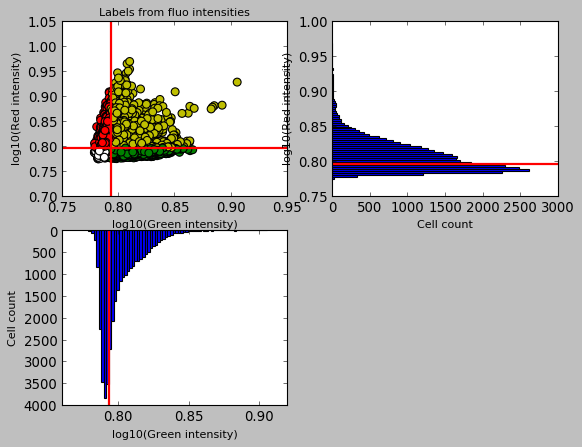

In [351]:
#
# Luca snippet
#

fluo_field = 'Intensity_MeanIntensity_'
red_C = labels[:, 0]
green_C = labels[:, 1]
X = np.array([np.log10(green_C + 1), np.log10(red_C + 1)]).T #log transform raw measurements

#Plot the results
fontsize = 10
plt.figure()
plt.subplot(221)
plt.scatter(X[:, 0], X[:, 1], 50, alpha=1.0, c=color)
plt.xlabel('log10(Green intensity)', fontsize=fontsize)
plt.ylabel('log10(Red intensity)', fontsize=fontsize)
plt.title('Labels from fluo intensities', fontsize=fontsize)
plt.axvline(x=thresh_fun(X[:,0]), color='red', linewidth=2)
plt.axhline(y=thresh_fun(X[:,1]), color='red', linewidth=2)

ax = plt.subplot(223)
plt.hist(X[:, 0], 70)
plt.xlabel('log10(Green intensity)', fontsize=fontsize)
plt.ylabel('Cell count', fontsize=fontsize)
plt.axvline(x=thresh_fun(X[:,0]), color='red', linewidth=2)
ax.invert_yaxis()

ax = plt.subplot(222)
ax.hist(X[:, 1], 70, orientation="horizontal")
plt.ylabel('log10(Red intensity)', fontsize=fontsize)
plt.xlabel('Cell count', fontsize=fontsize)
plt.axhline(y=thresh_fun(X[:,1]), color='red', linewidth=2)

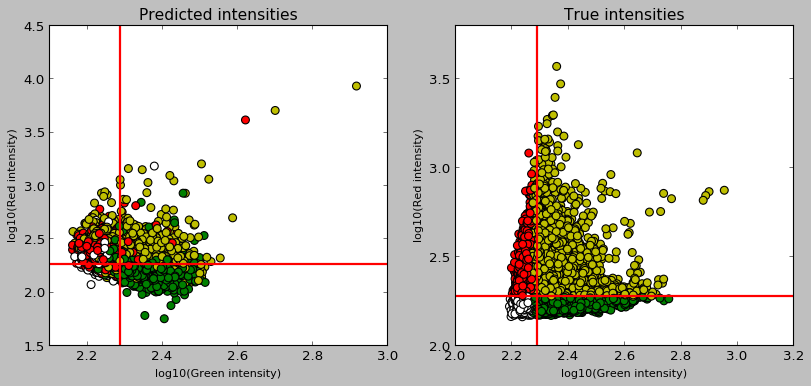

In [252]:
plt.figure(figsize=(12, 5))
plt.subplot(121)
plt.scatter(np.log10(5 + x[:, 1]), np.log10(5 + x[:, 0]), 50, alpha=1.0, c=color)
plt.xlabel('log10(Green intensity)', fontsize=fontsize)
plt.ylabel('log10(Red intensity)', fontsize=fontsize)
plt.title('Predicted intensities', fontsize=fontsize + 4)
plt.axvline(x=thresh_fun(np.log10(5 + x[:, 0])), color='red', linewidth=2)
plt.axhline(y=thresh_fun(np.log10(5 + x[:, 1])), color='red', linewidth=2)

plt.subplot(122)
plt.scatter(np.log10(2 + labels[:, 1]), np.log10(2 + labels[:, 0]), 50, alpha=1.0, c=color)
plt.xlabel('log10(Green intensity)', fontsize=fontsize)
plt.ylabel('log10(Red intensity)', fontsize=fontsize)
plt.title('True intensities', fontsize=fontsize + 4)
plt.axvline(x=thresh_fun(np.log10(2 + labels[:, 0])), color='red', linewidth=2)
plt.axhline(y=thresh_fun(np.log10(2 + labels[:, 1])), color='red', linewidth=2)

## 1.1 Accuracy

In [253]:
y1_mean, y1_std = 354, 560 # red channel
y2_mean, y2_std = 222, 83  # green channel

red_err, green_err = np.mean(np.abs(x - labels) / labels * 100, axis=0)
print("Intensity error:\n\tred chnl {:0.2f}% ({:0.2f}% std)\n\tgreen chnl {:0.2f}% ({:0.2f}% std)".format(red_err, red_err * y1_mean / y1_std, green_err, green_err * y2_mean / y2_std))

Intensity error:
	red chnl 18.87% (11.93% std)
	green chnl 10.58% (28.30% std)


## 1.2 Normalize and downscale standard deviation in Red channel...

In [258]:
scale_factor = 6

x -= x.mean(axis=0)
x /= x.std(axis=0)
x[:, 0] /= scale_factor
x += 10

labels -= labels.mean(axis=0)
labels /= labels.std(axis=0)
labels[:, 0] /= scale_factor
labels += 10

## 1.3 ..or whiten

In [266]:
_, x_w, _, _ = whitening(x)
_, labels_w, _, _ = whitening(labels)

np.cov(x_w, rowvar=False)

array([[ 1.00000000e+00, -4.17524054e-16],
       [-4.17524054e-16,  1.00000000e+00]])

## 1.4 Embedding of 2-dimensional feature vectors

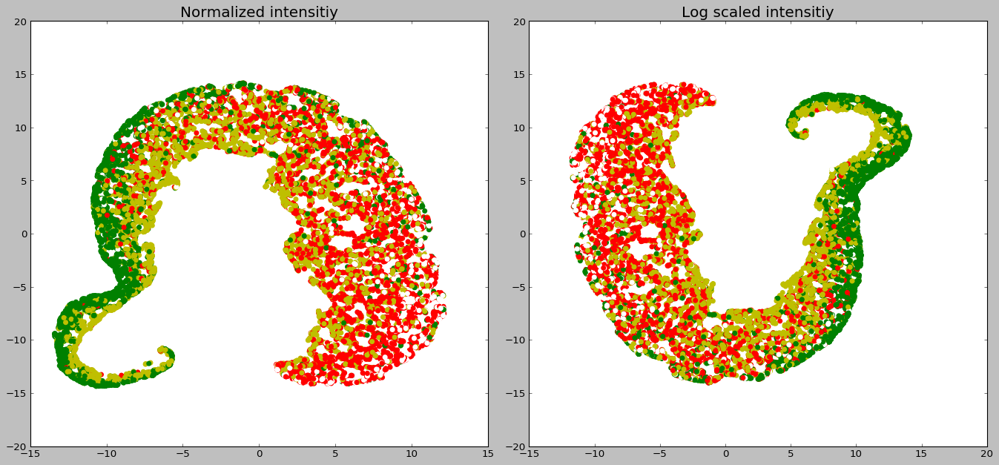

In [261]:
fig = plt.figure(figsize=(17, 8))

ax = fig.add_subplot(121)
umap_transform_plot(x, color, n_neighbors=50, min_dist=0.5, metric="euclidean", title='Normalized intensitiy'.format(metric), n_components=2)
ax = fig.add_subplot(122)
umap_transform_plot(np.log(x), color, n_neighbors=50, min_dist=0.5, metric="euclidean", title='Log scaled intensitiy'.format(metric), n_components=2)

plt.tight_layout()

In [269]:
metric = "euclidean"
embeddings_preds = umap_transform(np.log(x), n_neighbors=500, min_dist=0.5, n_components=2, metric=metric)
embeddings_labels = umap_transform(np.log(labels), n_neighbors=500, min_dist=0.5, n_components=2, metric=metric)

## 1.5 Define RGB colorization

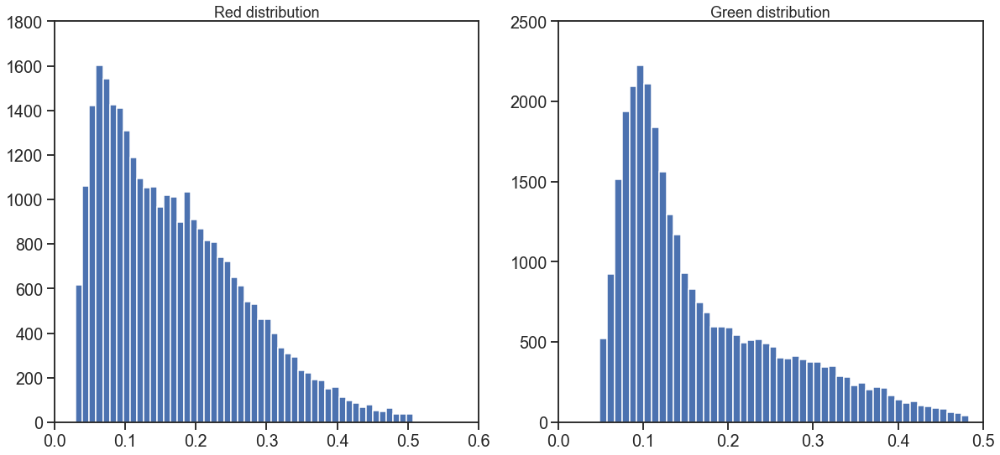

In [8]:
def map2uni_distr(a):
    idx = np.argsort(a)
    return np.linspace(0, 1, len(a))[idx]

def map2sq_distr(a):
    idx = np.argsort(a)
    x = np.linspace(0, 0.99, len(a))
    return np.square(x)[idx]

rgb = np.log(labels)
rgb = (rgb - rgb.min(0)) / (rgb.max(0) - rgb.min(0))
rgb = np.hstack([rgb, np.zeros((len(rgb), 1))])

# rgb[:, 0] = map2uni_distr(rgb[:, 0])
# rgb[:, 1] = map2uni_distr(rgb[:, 1])

cutoff = 1
idx = np.logical_and(
    np.logical_and(rgb[:, 0] > np.percentile(rgb[:, 0], cutoff), rgb[:, 0] < np.percentile(rgb[:, 0], 100 - cutoff)),
    np.logical_and(rgb[:, 1] > np.percentile(rgb[:, 1], cutoff), rgb[:, 1] < np.percentile(rgb[:, 1], 100 - cutoff)))

fig = plt.figure(figsize=(17, 8))
ax = fig.add_subplot(121)
plt.hist(rgb[idx, 0], 50)
plt.title("Red distribution", fontsize=18)

ax = fig.add_subplot(122)
plt.hist(rgb[idx, 1], 50)
plt.title("Green distribution", fontsize=18)

plt.tight_layout()

## 1.6 Mapping: Predicted vs. Ground truth in RGB colorization

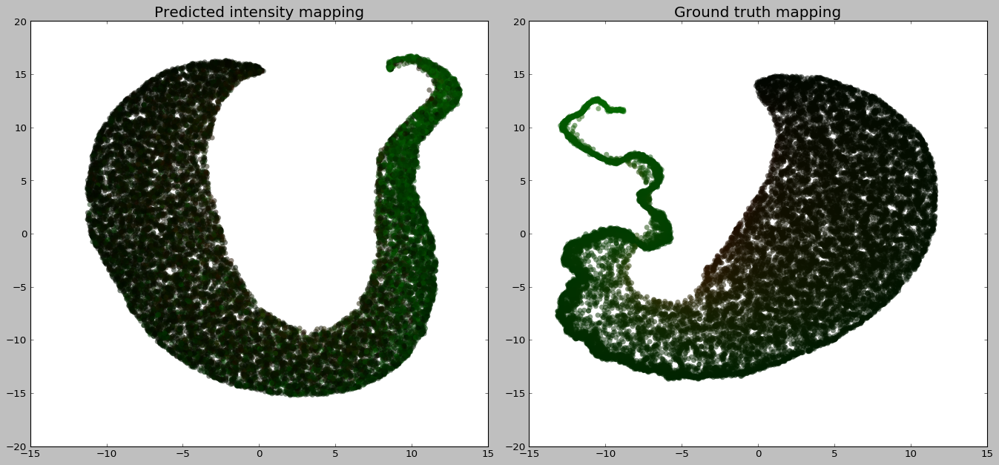

In [274]:
fig = plt.figure(figsize=(17, 8))

ax = fig.add_subplot(121)
umap_plot(embeddings_preds[idx], rgb[idx], n_components=2, title="Predicted intensity mapping", colorbar=False, alpha=0.5, cmap=None)
ax = fig.add_subplot(122)
umap_plot(embeddings_labels[idx], rgb[idx], n_components=2, title="Ground truth mapping", colorbar=False, alpha=0.5, cmap=None)

plt.tight_layout()

## 1.7 Comparison of RGB and categorical colorization

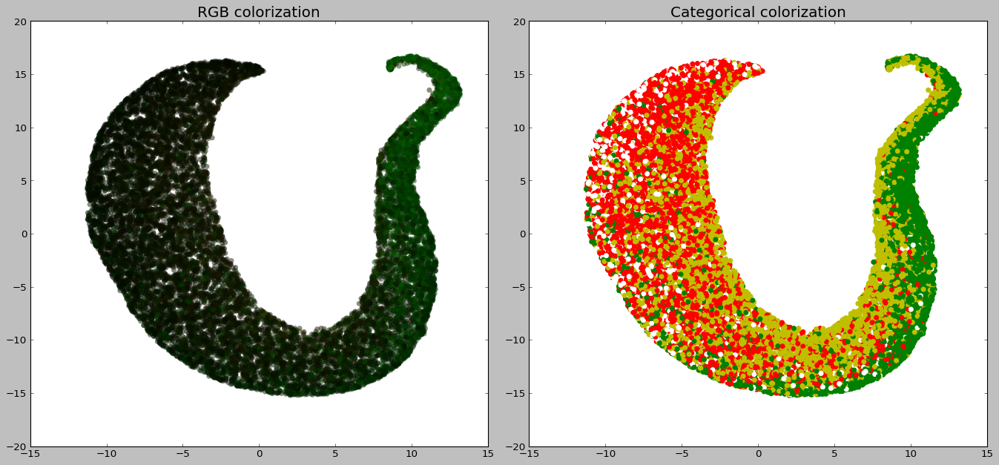

In [277]:
fig = plt.figure(figsize=(17, 8))

ax = fig.add_subplot(121)
umap_plot(embeddings_preds[idx], rgb[idx], n_components=2, title="RGB colorization", colorbar=False, alpha=0.5, cmap=None)
ax = fig.add_subplot(122)
umap_plot(embeddings_preds[idx], color[idx], n_components=2, title="Categorical colorization", colorbar=False, alpha=1.0, cmap=None)

plt.tight_layout()







# 2. Classification framework

In [3]:
with open("data/processed/Well1/descriptors_cls6_100_chnl4.pkl", "rb") as f:
    y, x, labels = pickle.load(f)
print(y.shape, x.shape, labels.shape)

(32275,) (32275, 6) (32275, 2)


## 2.1 log transform

In [4]:
x = np.log(x)
labels = np.log(labels)

In [7]:
color = np.array(["w"] * len(labels)) # w
color[np.logical_and(labels[:,0] > thresh_fun(labels[:,0]), labels[:,1] > thresh_fun(labels[:,1]))] = "y" # y
color[np.logical_and(labels[:,0] < thresh_fun(labels[:,0]), labels[:,1] > thresh_fun(labels[:,1]))] = "g" # g
color[np.logical_and(labels[:,0] > thresh_fun(labels[:,0]), labels[:,1] < thresh_fun(labels[:,1]))] = "r" # r

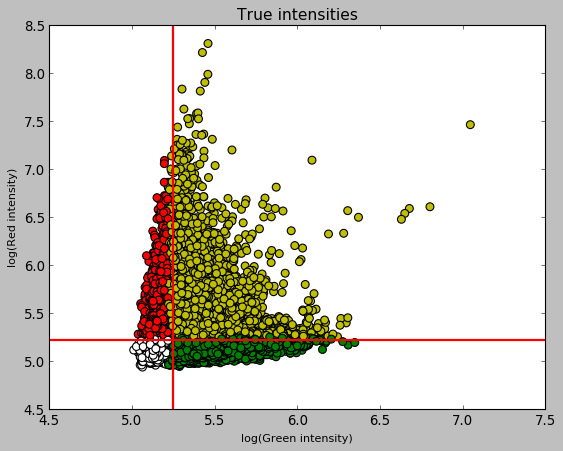

In [8]:
fontsize = 10
plt.figure()
plt.scatter(labels[:, 1], labels[:, 0], 50, alpha=1.0, c=color)
plt.xlabel('log(Green intensity)', fontsize=fontsize)
plt.ylabel('log(Red intensity)', fontsize=fontsize)
plt.title('True intensities', fontsize=fontsize + 4)
plt.axvline(x=thresh_fun(labels[:, 0]), color='red', linewidth=2)
plt.axhline(y=thresh_fun(labels[:, 1]), color='red', linewidth=2)

In [73]:
metric = "euclidean"
embeddings_preds = umap_transform(x, n_neighbors=50, min_dist=0.5, n_components=2, metric=metric)

In [34]:
rgb = labels.copy()
rgb = (rgb - rgb.min(0)) / (rgb.max(0) - rgb.min(0))
rgb = np.hstack([rgb, np.zeros((len(rgb), 1))])

cutoff = 1
idx = np.logical_and(
np.logical_and(rgb[:, 0] > np.percentile(rgb[:, 0], cutoff), rgb[:, 0] < np.percentile(rgb[:, 0], 100 - cutoff)),
np.logical_and(rgb[:, 1] > np.percentile(rgb[:, 1], cutoff), rgb[:, 1] < np.percentile(rgb[:, 1], 100 - cutoff)))

## 2.2 Comparison of RGB and categorical colorization

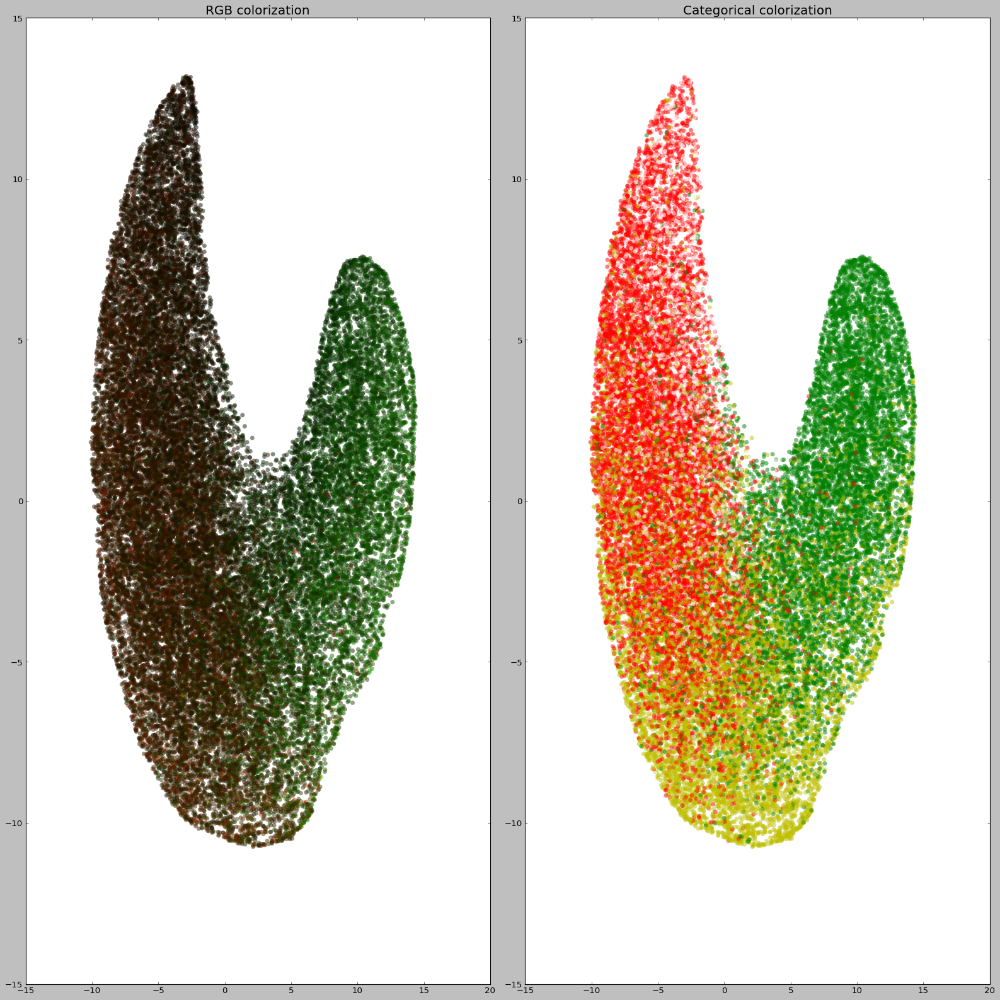

In [75]:
n_components = 2
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(121)
umap_plot(embeddings_preds, rgb, n_components=n_components, title="RGB colorization", colorbar=False, alpha=0.5, cmap=None)
ax = fig.add_subplot(122)
umap_plot(embeddings_preds, color, n_components=n_components, title="Categorical colorization", colorbar=False, alpha=0.5, cmap=None)
plt.tight_layout()

## 2.3 No log transform.

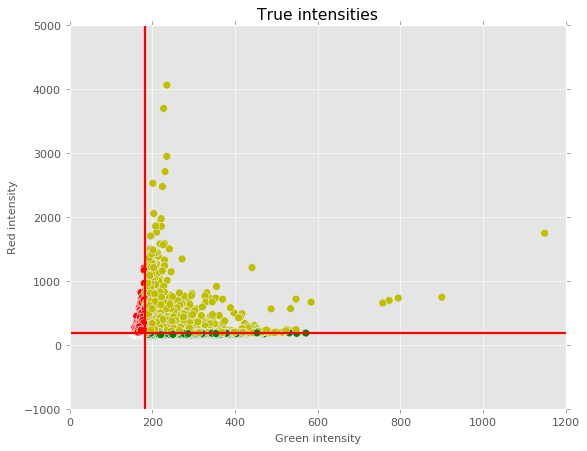

In [95]:
x = np.exp(x)
labels = np.exp(labels)

color = np.array(["w"] * len(labels)) # w
color[np.logical_and(labels[:,0] > thresh_fun(labels[:,0]), labels[:,1] > thresh_fun(labels[:,1]))] = "y" # y
color[np.logical_and(labels[:,0] < thresh_fun(labels[:,0]), labels[:,1] > thresh_fun(labels[:,1]))] = "g" # g
color[np.logical_and(labels[:,0] > thresh_fun(labels[:,0]), labels[:,1] < thresh_fun(labels[:,1]))] = "r" # r

plt.figure()
plt.scatter(labels[:, 1], labels[:, 0], 50, alpha=1.0, c=color)
plt.xlabel('Green intensity', fontsize=fontsize)
plt.ylabel('Red intensity', fontsize=fontsize)
plt.title('True intensities', fontsize=fontsize + 4)
plt.axvline(x=thresh_fun(labels[:, 0]), color='red', linewidth=2)
plt.axhline(y=thresh_fun(labels[:, 1]), color='red', linewidth=2)

In [442]:
metric = "manhattan"
embeddings_preds = umap_transform(x, n_neighbors=50, min_dist=0.5, n_components=2, metric=metric)

In [20]:
rgb = labels.copy()
rgb = (rgb - rgb.min(0)) / (rgb.max(0) - rgb.min(0))
rgb = np.hstack([rgb, np.zeros((len(rgb), 1))])

cutoff = 1
idx = np.logical_and(
np.logical_and(rgb[:, 0] > np.percentile(rgb[:, 0], cutoff), rgb[:, 0] < np.percentile(rgb[:, 0], 100 - cutoff)),
np.logical_and(rgb[:, 1] > np.percentile(rgb[:, 1], cutoff), rgb[:, 1] < np.percentile(rgb[:, 1], 100 - cutoff)))

## 2.4 Comparison of RGB and categorical colorization without log transform

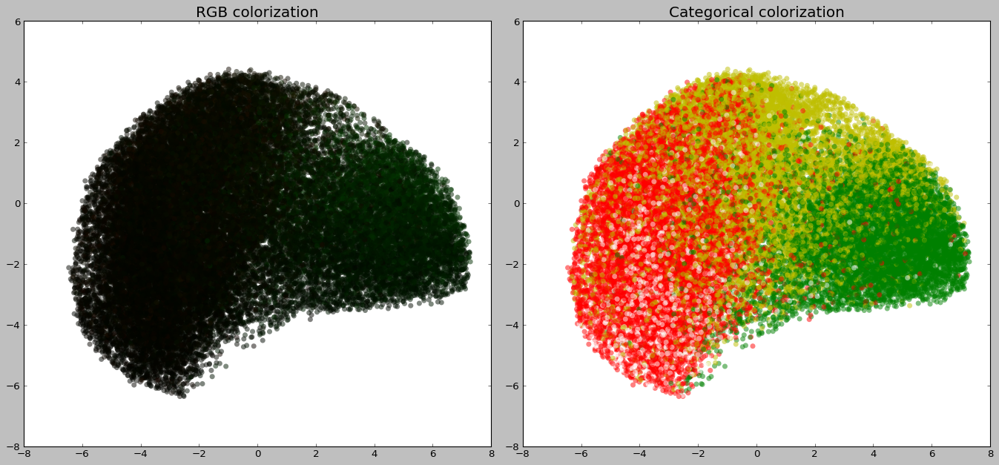

In [444]:
ax = fig.add_subplot(121)
umap_plot(embeddings_preds[idx], rgb[idx], n_components=2, title="RGB colorization", colorbar=False, alpha=0.5, cmap=None)
ax = fig.add_subplot(122)
umap_plot(embeddings_preds, color, n_components=2, title="Categorical colorization", colorbar=False, alpha=0.5, cmap=None)
plt.tight_layout()

## 2.5 Categorical splits

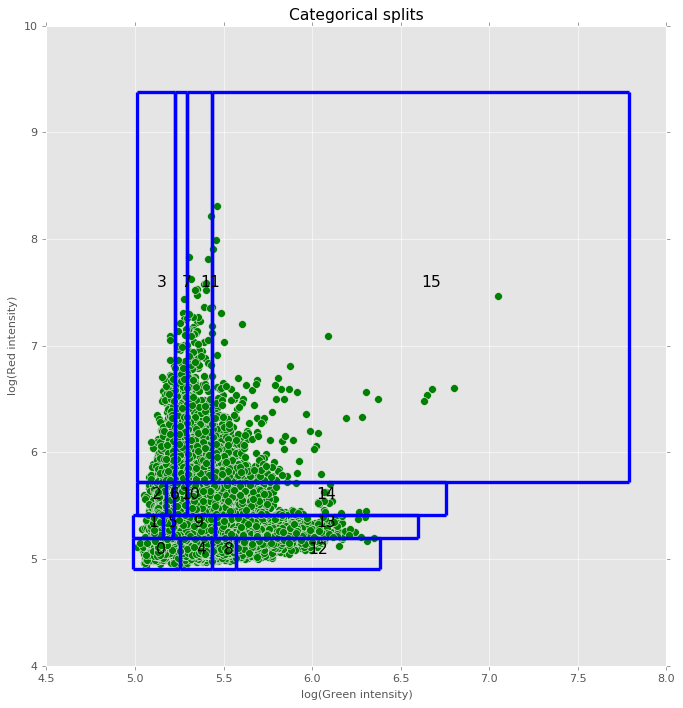

In [96]:
plt.figure(figsize=(10, 10))
plt.scatter(np.log(labels[:, 1]), np.log(labels[:, 0]), 50, alpha=1.0, c="g")
plt.xlabel('log(Green intensity)', fontsize=fontsize)
plt.ylabel('log(Red intensity)', fontsize=fontsize)
plt.title('Categorical splits', fontsize=fontsize + 4)

red_cat = [[135.393, 179.755], [179.755, 224.432], [224.432, 304.263], [304.263, 11810.042]]
green_cat = [
    [[146.392, 191.663], [191.663, 228.604], [228.604, 261.939], [261.939, 593.172]],
    [[146.933, 174.28], [174.28, 183.84], [183.84, 232.889], [232.889, 732.45]],
    [[150.433, 177.275], [177.275, 184.516], [184.516, 198.504], [198.504, 858.289]],
    [[150.293, 186.507], [186.507, 199.288], [199.288, 229.657], [229.657, 2415.641]]               
]

color = 'blue'
linewidth = 3
for i, (g, r) in enumerate(zip(green_cat, red_cat)):
    for j, gg in enumerate(g):
        plt.hlines(y=[np.log(r[0]), np.log(r[1])], xmin=np.log(gg[0]), xmax=np.log(gg[1]), color=color, linewidth=linewidth)
        plt.vlines(x=[np.log(gg[0]), np.log(gg[1])], ymin=np.log(r[0]), ymax=np.log(r[1]), color=color, linewidth=linewidth)
        plt.annotate(str(i + j * len(red_cat)), [(np.log(gg[0]) + np.log(gg[1])) / 2, (np.log(r[0]) + np.log(r[1])) / 2],
                    fontsize=14, color="black")

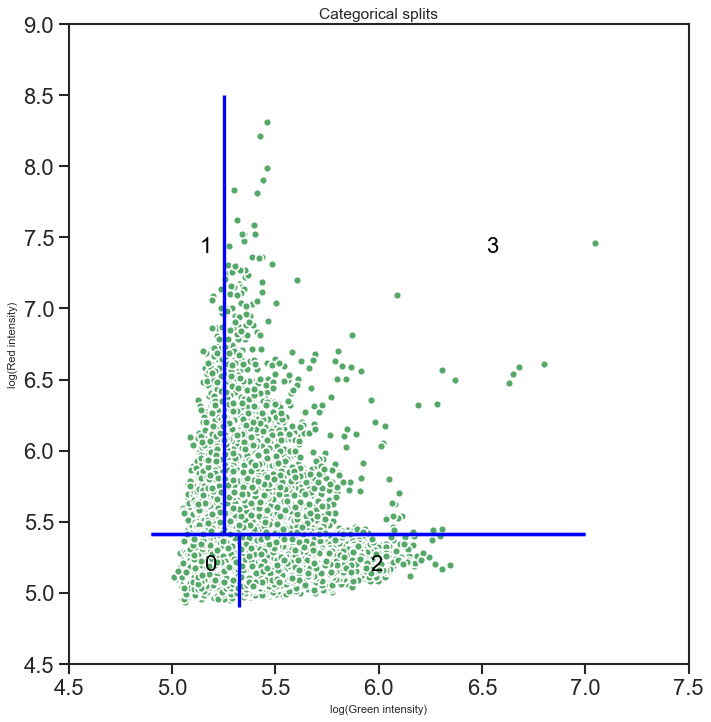

In [8]:
fontsize = 10
plt.figure(figsize=(10, 10))
plt.scatter(labels[:, 1], labels[:, 0], 50, alpha=1.0, c="g")
plt.xlabel('log(Green intensity)', fontsize=fontsize)
plt.ylabel('log(Red intensity)', fontsize=fontsize)
plt.title('Categorical splits', fontsize=fontsize + 4)

red_cat = [[135.393, 224.432], [224.432, 11810.042]]
green_cat = [
    [[146.392, 205.802], [205.802, 732.45]],
    [[150.293, 191.104], [191.104, 2415.641]]
]

xmin, xmax = 4.9, 7.0
ymin, ymax = 4.9, 8.5
color = 'blue'
linewidth = 3
for i, (g, r) in enumerate(zip(green_cat, red_cat)):
    for j, gg in enumerate(g):
        if i < len(red_cat) - 1:
            plt.hlines(y=[np.log(r[1])], xmin=xmin, xmax=xmax, color=color, linewidth=linewidth)
        if j < len(gg) - 1:
            if i == 0:
                plt.vlines(x=[np.log(gg[1])], ymin=ymin, ymax=np.log(r[1]), color=color, linewidth=linewidth)
            elif i == 1:
                plt.vlines(x=[np.log(gg[1])], ymin=np.log(r[0]), ymax=ymax, color=color, linewidth=linewidth)
        plt.annotate(str(i + j * len(red_cat)), [(np.log(gg[0]) + np.log(gg[1])) / 2, (np.log(r[0]) + np.log(r[1])) / 2],
                    fontsize=20, color="black")

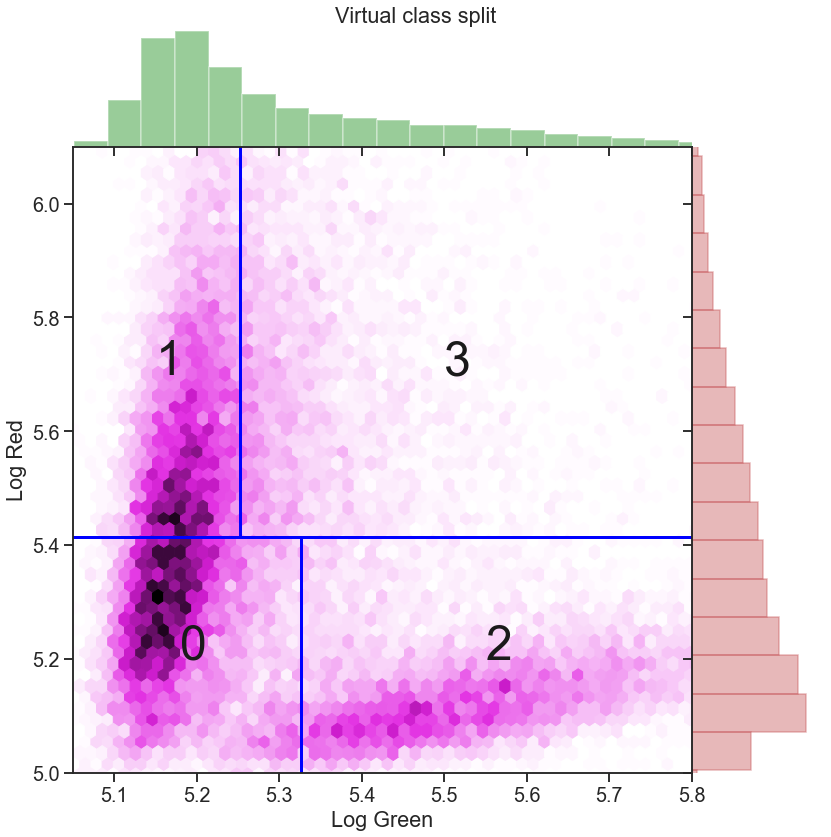

In [5]:
import seaborn as sns; sns.set(style="ticks", color_codes=True)
sns.set_context("talk", font_scale=1.2, rc={"lines.linewidth": 3.0})
g = sns.jointplot(x="Log Green", y="Log Red", 
                  data=pd.DataFrame(data={"Log Green": labels[:, 1], "Log Red": labels[:, 0]}),
                 xlim=(5.05, 5.8), ylim=(5, 6.1),
                 color="violet",
                 space=0,
                 kind="hex",
                 height=12,
                 ratio=5,
                 joint_kws={"gridsize": 150},
                 marginal_kws={'color': 'green'})
_ = plt.setp(g.ax_marg_y.patches, color="r")
df2 = pd.DataFrame(data={"x": [5.05, 5.8], "y": [np.log(224.432), np.log(224.432)]})
g.x = df2.x
g.y = df2.y
g.plot_joint(plt.plot, linestyle="-", linewidth=3, alpha=1.0, c="blue")
df2 = pd.DataFrame(data={"x": [np.log(205.802), np.log(205.802)], "y": [5, np.log(224.432)]})
g.x = df2.x
g.y = df2.y
g.plot_joint(plt.plot, linestyle="-", linewidth=3, alpha=1.0, c="blue")
df2 = pd.DataFrame(data={"x": [np.log(191.104), np.log(191.104)], "y": [np.log(224.432), 6.1]})
g.x = df2.x
g.y = df2.y
g.plot_joint(plt.plot, linestyle="-", linewidth=3, alpha=1.0, c="blue")
plt.gca().annotate("0", [5.18, 5.2], fontsize=48, color="k")
plt.gca().annotate("1", [5.15, 5.7], fontsize=48, color="k")
plt.gca().annotate("2", [5.55, 5.2], fontsize=48, color="k")
plt.gca().annotate("3", [5.5, 5.7], fontsize=48, color="k")
_ = g.fig.suptitle('Virtual class split')

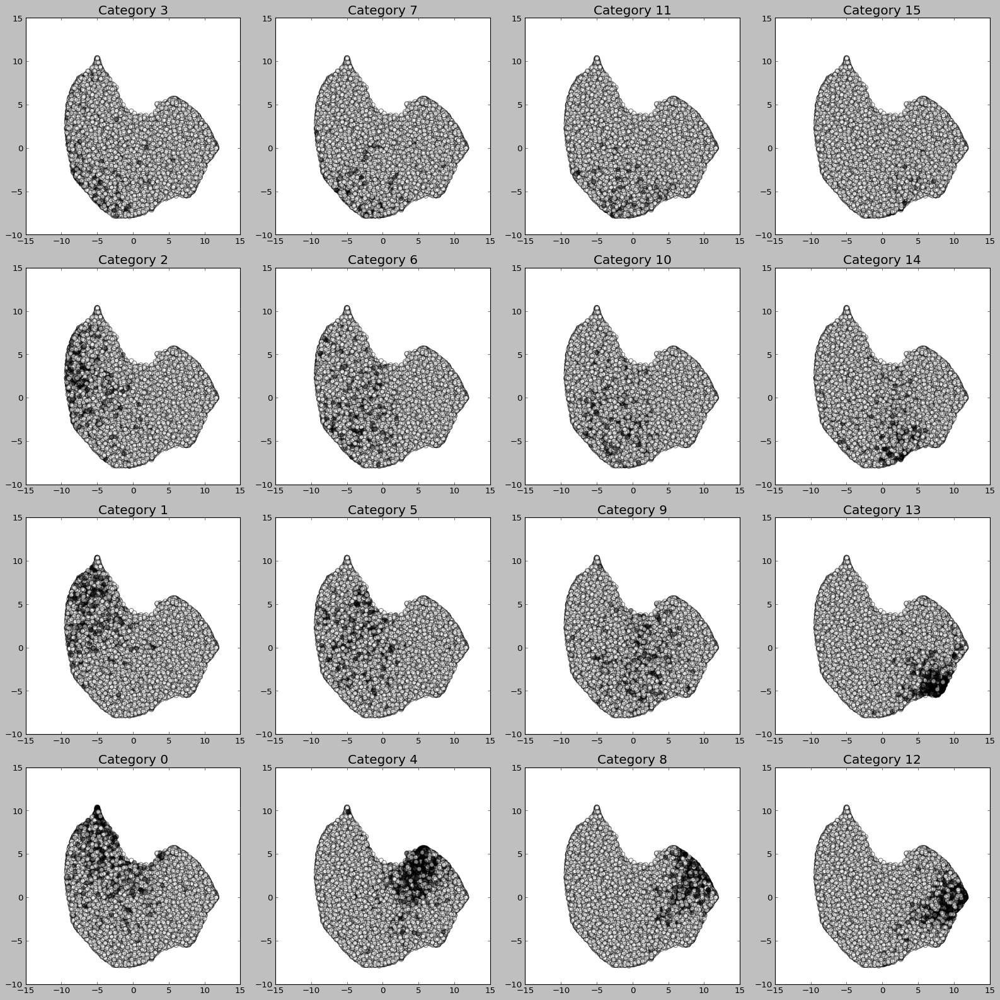

In [403]:
fig = plt.figure(figsize=(20, 20))
loc = np.argsort(np.arange(16).reshape(4, 4).T[::-1].flatten()) + 1
for i in range(y.max() + 1):
    ax = fig.add_subplot(4, 4, loc[i])
    ci = np.zeros_like(y)
    ci[y == i] = 1
    umap_plot(embeddings_preds, ci, n_components=2, title="Category {}".format(i), colorbar=False, alpha=0.5, cmap="Greys", linewidths=1)
plt.tight_layout()

In [24]:
idx = np.zeros_like(y)
for c in range(y.max() + 1):
    mask = y == c
    mean_ = x[mask].mean(0)
    std_ = x[mask].std(0)
    idx[mask] = np.all(np.abs(x[mask] - mean_) < 5 * std_, 1)
idx = idx.astype(bool)
sum(idx)

33451

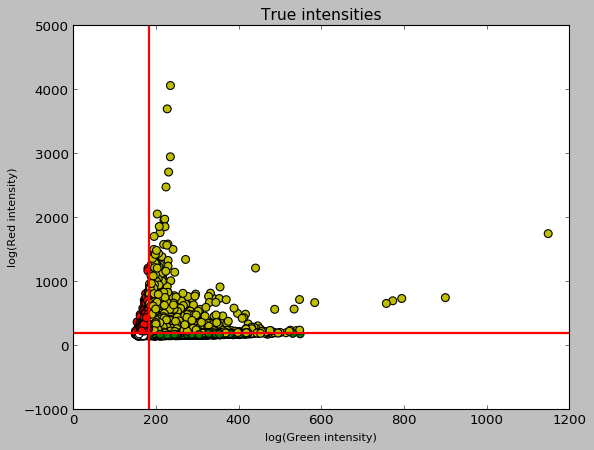

In [31]:
fontsize = 10
plt.figure()
plt.scatter(labels[idx, 1], labels[idx, 0], 50, alpha=1.0, c=color[idx])
plt.xlabel('log(Green intensity)', fontsize=fontsize)
plt.ylabel('log(Red intensity)', fontsize=fontsize)
plt.title('True intensities', fontsize=fontsize + 4)
plt.axvline(x=thresh_fun(labels[idx, 0]), color='red', linewidth=2)
plt.axhline(y=thresh_fun(labels[idx, 1]), color='red', linewidth=2)

In [6]:
metric = "correlation"
embeddings_preds = umap_transform(x, n_neighbors=300, min_dist=0.05, n_components=2, metric=metric)

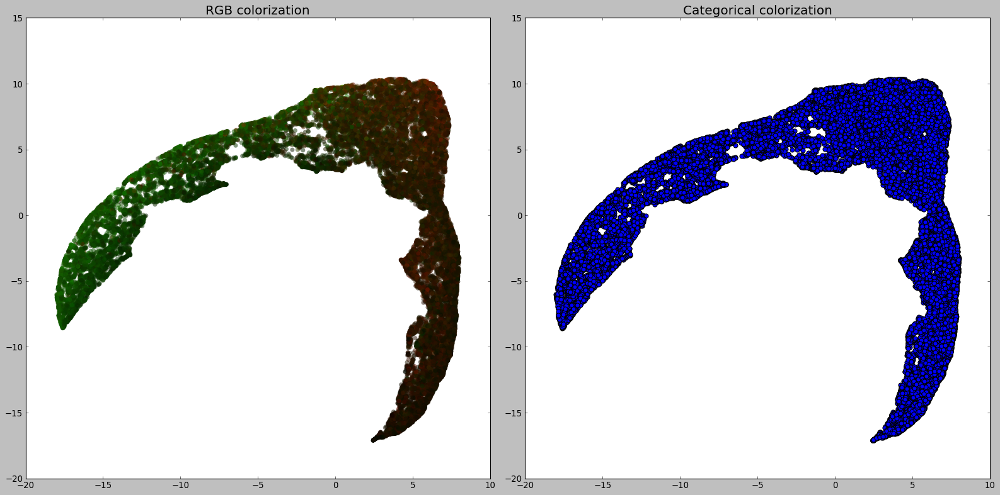

In [15]:
fig = plt.figure(figsize=(20, 10))
ax = fig.add_subplot(121)
umap_plot(embeddings_preds, rgb, n_components=2, title="RGB colorization", colorbar=False, alpha=0.5, cmap=None)
ax = fig.add_subplot(122)
umap_plot(embeddings_preds, color, n_components=2, title="Categorical colorization", colorbar=False, alpha=1, cmap=None, linewidths=1)
plt.tight_layout()

In [3]:
with open("data/processed/Well1/descriptors_cls4_52_chnl4.pkl", "rb") as f:
    y, x, labels = pickle.load(f)
print(y.shape, x.shape, labels.shape)

(33973,) (33973, 4) (33973, 2)


In [4]:
x = np.log(x)
labels = np.log(labels)

In [12]:
color = np.array(["w"] * len(labels)) # w
color[np.logical_and(labels[:,0] > thresh_fun(labels[:,0]), labels[:,1] > thresh_fun(labels[:,1]))] = "y" # y
color[np.logical_and(labels[:,0] < thresh_fun(labels[:,0]), labels[:,1] > thresh_fun(labels[:,1]))] = "g" # g
color[np.logical_and(labels[:,0] > thresh_fun(labels[:,0]), labels[:,1] < thresh_fun(labels[:,1]))] = "r" # r

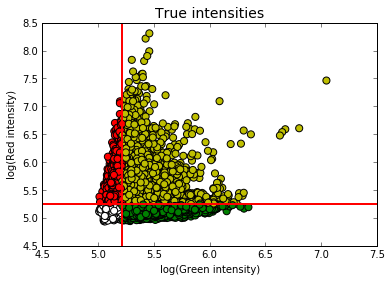

In [8]:
fontsize = 10
plt.figure()
plt.scatter(labels[:, 1], labels[:, 0], 50, alpha=1.0, c=color)
plt.xlabel('log(Green intensity)', fontsize=fontsize)
plt.ylabel('log(Red intensity)', fontsize=fontsize)
plt.title('True intensities', fontsize=fontsize + 4)
plt.axvline(x=thresh_fun(labels[:, 1]), color='red', linewidth=2)
plt.axhline(y=thresh_fun(labels[:, 0]), color='red', linewidth=2)

In [9]:
metric = "correlation"
embeddings_preds = umap_transform(x, n_neighbors=300, min_dist=0.05, n_components=2, metric=metric)

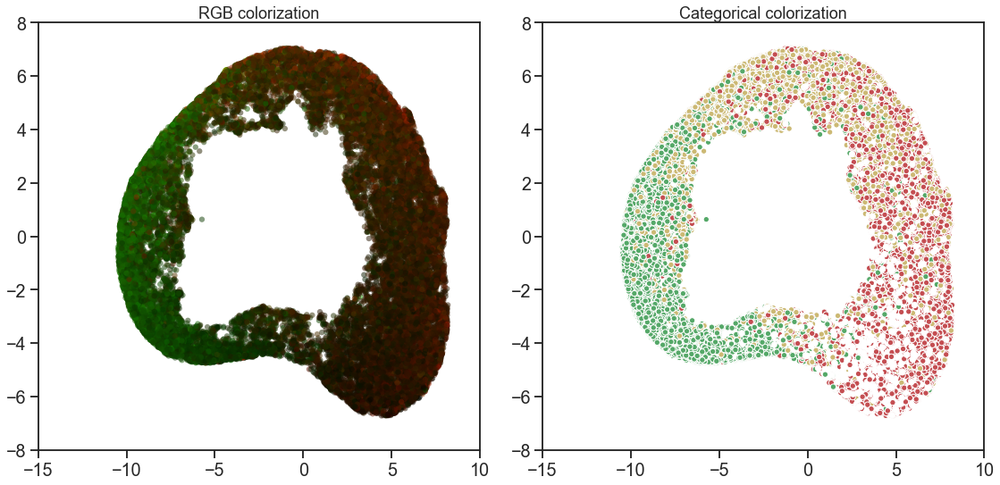

In [13]:
fig = plt.figure(figsize=(16, 8))
ax = fig.add_subplot(121)
umap_plot(embeddings_preds, rgb, n_components=2, title="RGB colorization", colorbar=False, alpha=0.5, cmap=None)
ax = fig.add_subplot(122)
umap_plot(embeddings_preds, color, n_components=2, title="Categorical colorization", colorbar=False, alpha=1, cmap=None, linewidths=1)
plt.tight_layout()

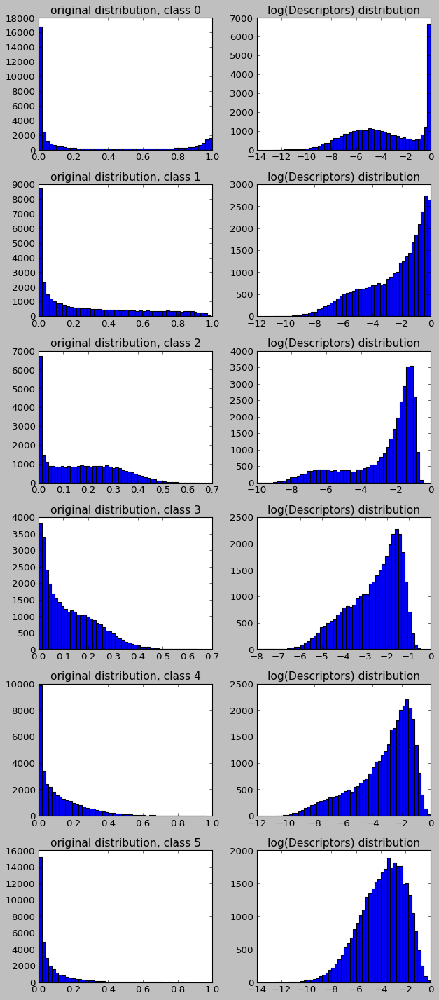

In [257]:
fig = plt.figure(figsize=(8, 18))

for n in range(x.shape[1]):
    ax = fig.add_subplot(6, 2, 1 + n * 2)
    plt.hist(np.exp(x[:, n]), 50)
    plt.title("original distribution, class {}".format(n), fontsize=14)

    ax = fig.add_subplot(6, 2, 2 + n * 2)
    plt.hist(x[:, n], 50)
    plt.title("log(Descriptors) distribution", fontsize=14)

plt.tight_layout()

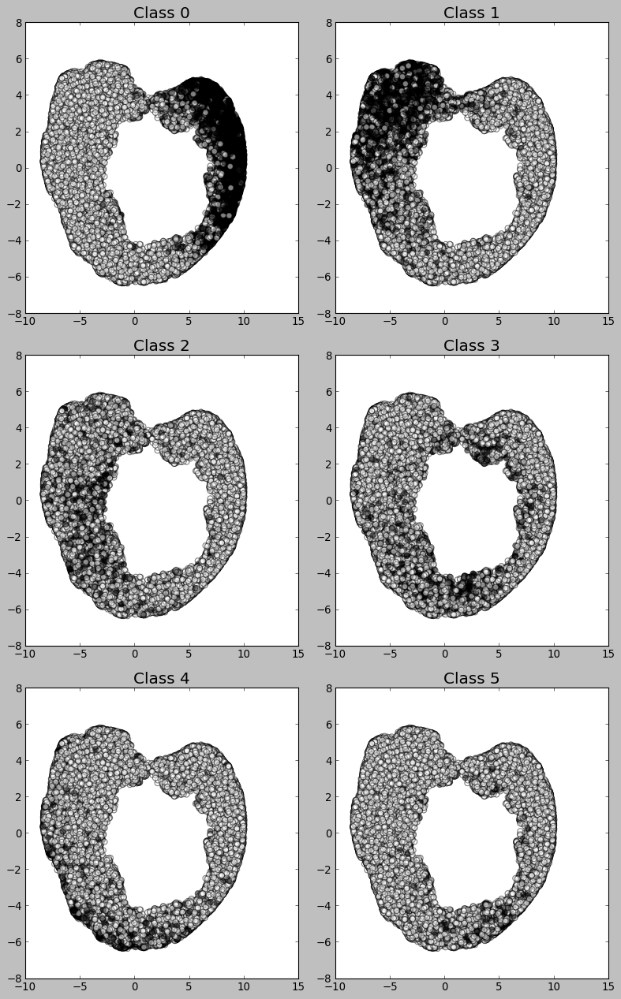

In [22]:
fig = plt.figure(figsize=(10, 16))
# loc = np.argsort(np.arange(16).reshape(4, 4).T[::-1].flatten()) + 1
for i in range(y.max() + 1):
    ax = fig.add_subplot(3, 2, i + 1)
    ci = np.zeros_like(y)
    ci[y == i] = 1
    umap_plot(embeddings_preds, ci, n_components=2, title="Class {}".format(i), colorbar=False, alpha=0.5, cmap="Greys", linewidths=1)
plt.tight_layout()

## 2.6 Angular projection

In [10]:
center_x, center_y = 1.0, 2.0
s_ = embeddings_preds - (center_x, center_y)
angle = np.pi / 2 - np.arctan(s_[:, 1] / s_[:, 0])
angle += np.pi * (s_[:, 0] < 0)
angle *= 360 / (2 * np.pi)

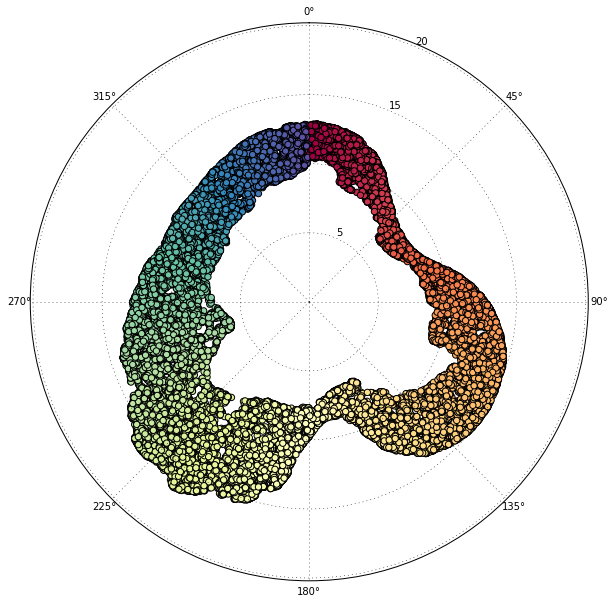

In [11]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection="polar")
ax.scatter(angle / 360 * 2 * np.pi, np.sqrt((np.square(s_) / (1, 1)).sum(1)), s=40, c=angle, cmap="Spectral", alpha=1, linewidths=1)
ax.set_theta_zero_location('N')
ax.set_theta_direction(-1)
# ax.set_rorigin([1, 2])

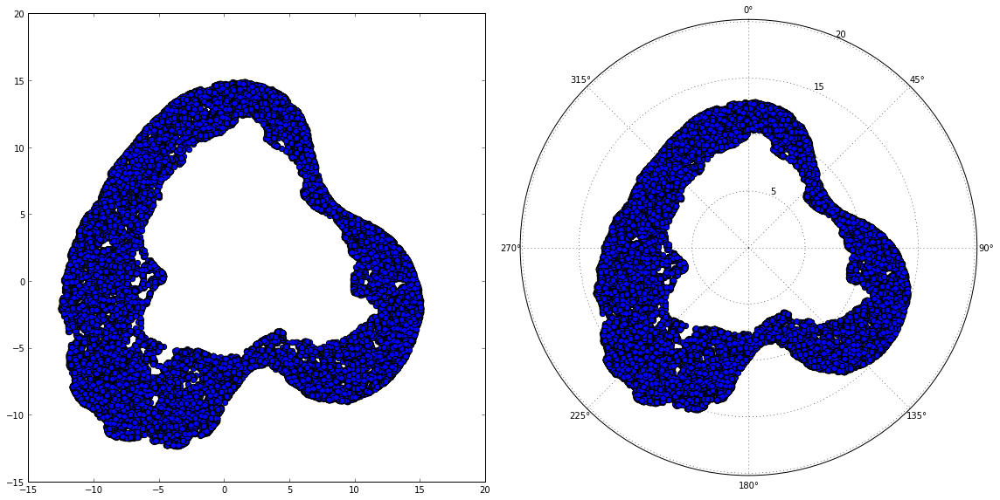

In [12]:
fig = plt.figure(figsize=(16, 8))
ax = fig.add_subplot(121)
umap_plot(embeddings_preds, None, n_components=2, title="", colorbar=False, alpha=1, cmap=None, linewidths=1)
ax = fig.add_subplot(122, projection="polar")
ax.scatter(angle / 360 * 2 * np.pi, np.sqrt((np.square(s_) / (1, 1)).sum(1)), s=40, c=None, cmap="Spectral", alpha=1, linewidths=1)
ax.set_theta_zero_location('N')
ax.set_theta_direction(-1)
plt.tight_layout()

In [13]:
steps = 100
intervals = np.digitize(angle, np.linspace (0, 360, steps))
intensities = []
for i in range(1, steps):
    intensities.append(labels[intervals == i].mean(axis=0))
intensities = np.array(intensities)

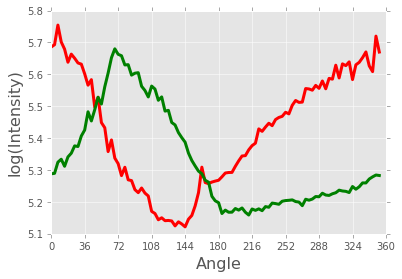

In [14]:
plt.style.use('ggplot')
plt.plot(intensities[:, 0], c="red", linewidth=3)
plt.plot(intensities[:, 1], c="green", linewidth=3)
plt.ylabel("log(Intensity)", fontsize=16)
plt.xlabel("Angle", fontsize=16)
_ = plt.xticks(range(steps + 1)[::10], np.arange(0, 361, 36))

In [15]:
angle_adjusted = angle + 180
angle_adjusted[angle_adjusted > 360] -= 360
angle_adjusted[angle_adjusted < 0] += 360
# angle_adjusted = 360 - angle_adjusted

In [16]:
steps = 100
intervals = np.digitize(angle_adjusted, np.linspace (0, 360, steps))
intensities = []
stdev = []
quant = []
moving = 5
for i in range(1, steps):
    if i - moving < 1:
        rng = np.logical_or(steps - 1 + (i - moving) <= intervals, intervals <= i + moving)
    elif i + moving > steps - 1:
        rng = np.logical_or(i - moving <= intervals, intervals <= (i + moving) - steps + 1)
    else:
        rng = np.logical_and(i - moving <= intervals, intervals <= i + moving)
    intensities.append(labels[rng].mean(axis=0))
    stdev.append(labels[rng].std(axis=0))
    quant.append(len(labels[rng]))
intensities = np.array(intensities)
stdev = np.array(stdev)
quant = np.array(quant)
lo = np.percentile(intensities, 0, axis=0)
hi = np.percentile(intensities, 100, axis=0)
intensities = (intensities - lo) / (hi - lo)
stdev = stdev / (hi - lo) * 0.5

Text(0.5, 1.0, 'Fluo signal with 0.5 std bands and cell count')

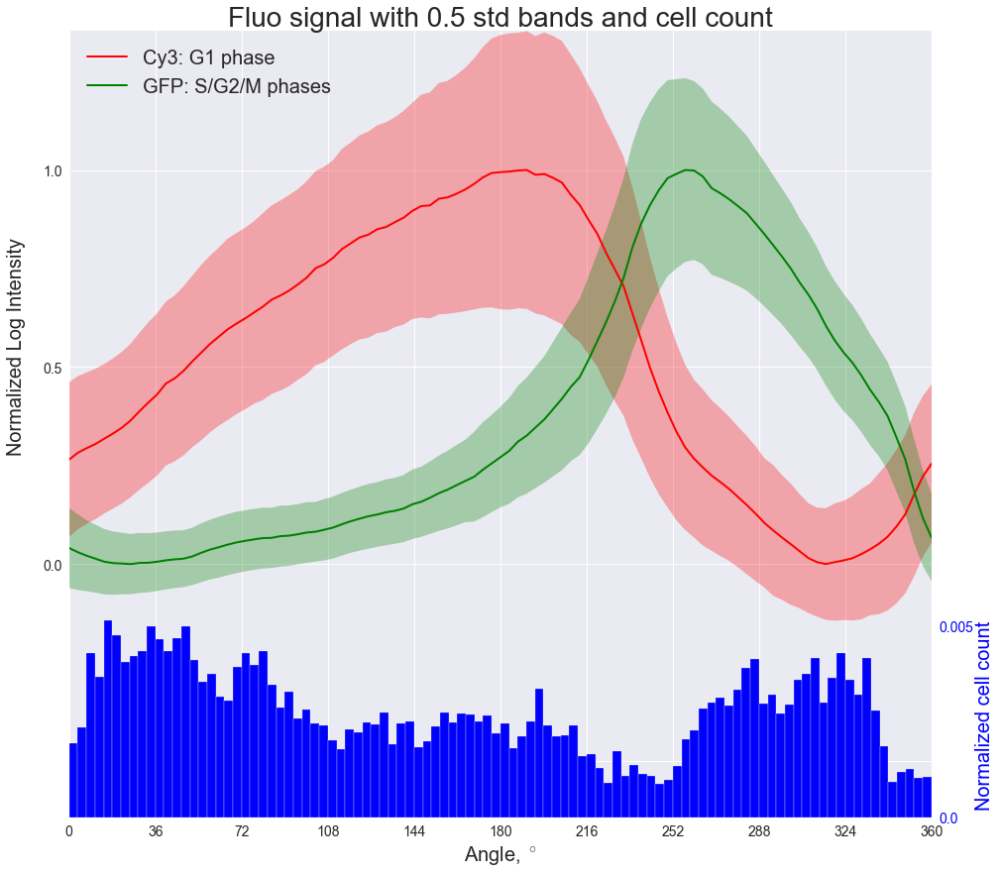

In [17]:
style = 'seaborn'
plt.style.use(style)

fig, ax1 = plt.subplots(figsize=(14, 12))
div = 0.25
linewidth = 2
x = np.linspace(0, 360, steps - 1)
ax1.plot(x, intensities[:, 0], c="red", linewidth=linewidth)
ax1.fill_between(x=x, y1=intensities[:, 0] - stdev[:, 0], y2=intensities[:, 0] + stdev[:, 0], 
                 color="red", edgecolor="", alpha=0.3)
ax1.plot(x, intensities[:, 1], c="green", linewidth=linewidth)
ax1.fill_between(x=x, y1=intensities[:, 1] - stdev[:, 1], y2=intensities[:, 1] + stdev[:, 1], 
                 color="green", edgecolor="", alpha=0.3)

ax1.tick_params("both", labelsize=14)
ax1.set_xlabel("Angle, $^\circ$", fontsize=20)
ax1.set_xticks(np.arange(0, 361, 36))
ax1.set_xlim(x.min(), x.max())
ax1.set_ylabel("Normalized Log Intensity", fontsize=20)
ax1.yaxis.set_label_coords(-0.05, 0.6)
l, h = (intensities - stdev).min(), (intensities + stdev).max()
ax1.set_ylim((l - div * h) / (1 - div), h)
ticks = ax1.get_yticks()
ticks = [t if t >= l else "" for t in ticks]
ax1.set_yticklabels(ticks)
ax1.legend(["Cy3: G1 phase", "GFP: S/G2/M phases"], loc="upper left", fontsize=20)

ax2 = ax1.twinx()
q, _, _ = ax2.hist(angle_adjusted, bins=100, density=True, color='b')

ax2.tick_params("y", labelsize=14)
ax2.set_ylabel('Normalized cell count', color='b', fontsize=20)
ax2.yaxis.set_label_coords(1.05, 0.13)
l, h = q.min(), q.max()
ax2.set_ylim(0, h / div)
ax2.tick_params('y', colors='b')
ticks = ax2.get_yticks()
ticks = [t if t <= h else "" for t in ticks]
ax2.set_yticklabels(ticks)
ax2.grid(False)

fig.tight_layout()
ax1.set_title("Fluo signal with 0.5 std bands and cell count", fontsize=28)

In [349]:
plt.style.available

['bmh',
 'classic',
 'dark_background',
 'fast',
 'fivethirtyeight',
 'ggplot',
 'grayscale',
 'seaborn-bright',
 'seaborn-colorblind',
 'seaborn-dark-palette',
 'seaborn-dark',
 'seaborn-darkgrid',
 'seaborn-deep',
 'seaborn-muted',
 'seaborn-notebook',
 'seaborn-paper',
 'seaborn-pastel',
 'seaborn-poster',
 'seaborn-talk',
 'seaborn-ticks',
 'seaborn-white',
 'seaborn-whitegrid',
 'seaborn',
 'Solarize_Light2',
 'tableau-colorblind10',
 '_classic_test']

In [375]:
plt.style.library['_classic_test']

RcParams({'_internal.classic_mode': True,
          'agg.path.chunksize': 0,
          'animation.avconv_args': [],
          'animation.avconv_path': 'avconv',
          'animation.bitrate': -1,
          'animation.codec': 'mpeg4',
          'animation.convert_args': [],
          'animation.convert_path': 'convert',
          'animation.ffmpeg_args': [],
          'animation.ffmpeg_path': 'ffmpeg',
          'animation.frame_format': 'png',
          'animation.html': 'none',
          'animation.writer': 'ffmpeg',
          'axes.autolimit_mode': 'round_numbers',
          'axes.axisbelow': False,
          'axes.edgecolor': 'white',
          'axes.facecolor': '#E5E5E5',
          'axes.formatter.limits': [-7, 7],
          'axes.formatter.offset_threshold': 2,
          'axes.formatter.use_locale': False,
          'axes.formatter.use_mathtext': False,
          'axes.formatter.useoffset': True,
          'axes.grid': False,
          'axes.grid.axis': 'both',
          'axes.gri

In [332]:
(intensities - stdev).min(0)

array([-0.14907726, -0.07654901])

In [367]:
df = pd.DataFrame(np.hstack([labels, s_]), columns=["red", "green", "x", "y"])
df.to_csv("data/embeddings_preds.csv", index=True)


In [324]:
df = pd.DataFrame(np.hstack([labels, x]), columns=["red", "green", "c0", "c1", "c2", "c3", "c4", "c5"])
df.to_csv("data/preds.csv", index=True)

(5, 6)

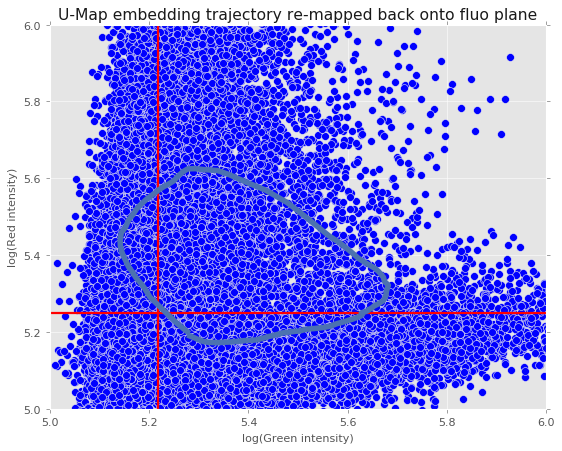

In [86]:
raw_intensities = intensities * (hi - lo) + lo
fontsize = 10
plt.figure()
plt.scatter(labels[:, 1], labels[:, 0], 50, alpha=1.0, c=color)
plt.xlabel('log(Green intensity)', fontsize=fontsize)
plt.ylabel('log(Red intensity)', fontsize=fontsize)
plt.title('U-Map embedding trajectory re-mapped back onto fluo plane', fontsize=fontsize + 4)
plt.axvline(x=thresh_fun(labels[:, 1]), color='red', linewidth=2)
plt.axhline(y=thresh_fun(labels[:, 0]), color='red', linewidth=2)
plt.plot(raw_intensities[:, 0], raw_intensities[:, 1], linestyle="-", linewidth=5, alpha=1.0, c="b")
plt.xlim(5, 6)
plt.ylim(5, 6)

Text(0.5,0.98,'U-Map embedded trajectory re-mapped back onto fluo plane')

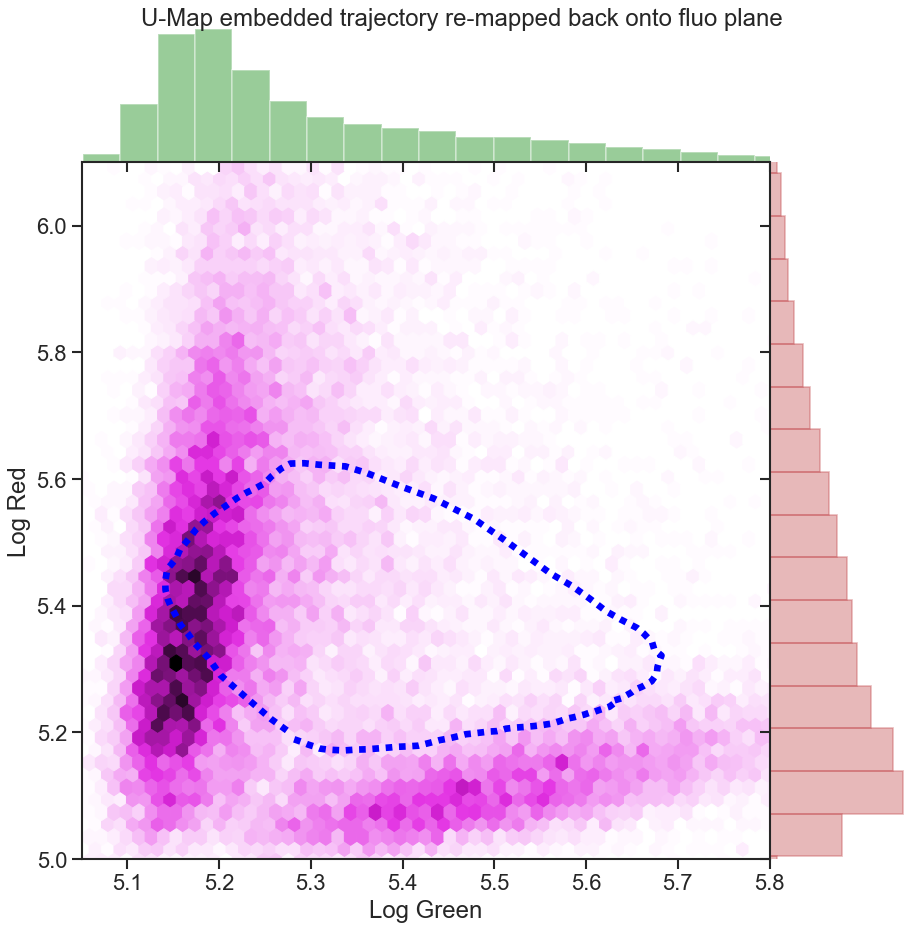

In [141]:
import seaborn as sns; sns.set(style="ticks", color_codes=True)
sns.set_context("talk", font_scale=1.2, rc={"lines.linewidth": 3.0})
g = sns.jointplot(x="Log Green", y="Log Red", 
                  data=pd.DataFrame(data={"Log Green": labels[:, 1], "Log Red": labels[:, 0]}),
                 xlim=(5.05, 5.8), ylim=(5, 6.1),
                 color="violet",
                 space=0,
                 kind="hex",
                 height=12,
                 ratio=5,
                 joint_kws={"gridsize": 150},
                 marginal_kws={'color': 'green'})
plt.setp(g.ax_marg_y.patches, color="r")
df2 = pd.DataFrame(data={"x": raw_intensities[:, 0], "y": raw_intensities[:, 1]})
g.x = df2.x
g.y = df2.y
g.plot_joint(plt.plot, linestyle="--", linewidth=6, alpha=1.0, c="blue")
g.fig.suptitle('U-Map embedded trajectory re-mapped back onto fluo plane')

In [136]:
steps = 100
intervals = np.digitize(angle, np.linspace (0, 360, steps))
intensities = []
moving = 5
for i in range(1, steps):
    if i - moving < 1:
        rng = np.logical_or(steps - 1 + (i - moving) <= intervals, intervals <= i + moving)
    elif i + moving > steps - 1:
        rng = np.logical_or(i - moving <= intervals, intervals <= (i + moving) - steps + 1)
    else:
        rng = np.logical_and(i - moving <= intervals, intervals <= i + moving)
    intensities.append(labels[rng].mean(axis=0))
intensities = np.array(intensities)
lo = np.percentile(intensities, 0, axis=0)
hi = np.percentile(intensities, 100, axis=0)
intensities = (intensities - lo) / (hi - lo)

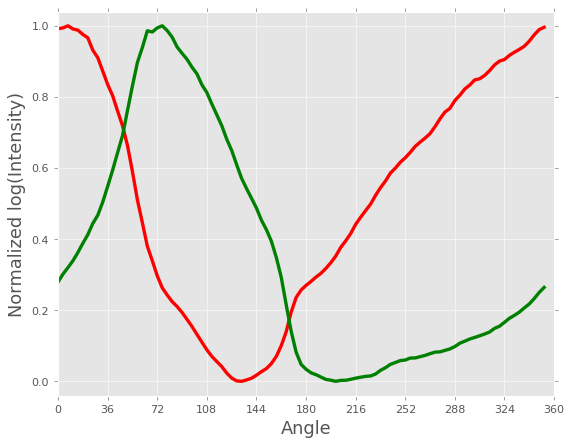

In [137]:
plt.style.use('ggplot')
plt.plot(intensities[:, 0], c="red", linewidth=3)
plt.plot(intensities[:, 1], c="green", linewidth=3)
plt.ylabel("Normalized log(Intensity)", fontsize=16)
plt.xlabel("Angle", fontsize=16)
plt.ylim(-0.04, 1.04)
_ = plt.xticks(range(steps + 1)[::10], np.arange(0, 361, 36))

Text(0,0.5,'Normalized Red intensity')

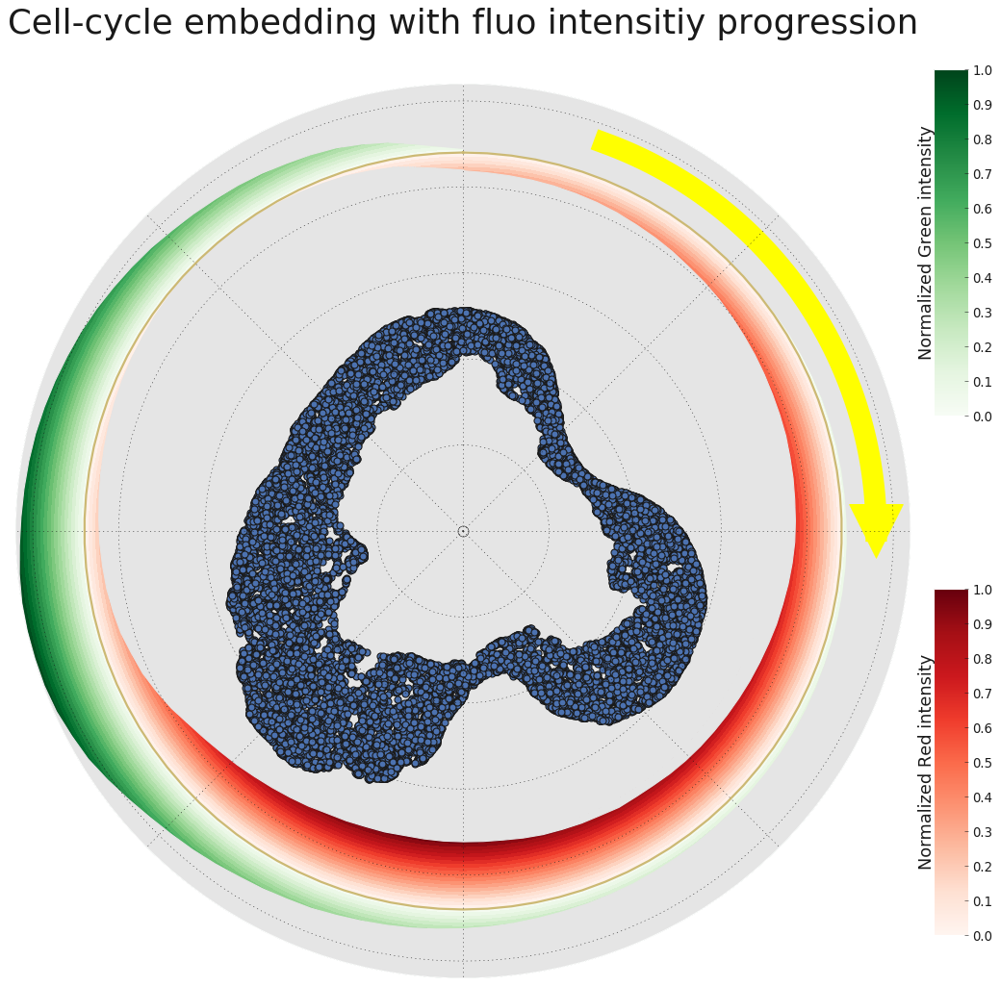

In [124]:
from matplotlib import colors, cm
import matplotlib as mpl
style = 'ggplot'
plt.style.library[style]['figure.facecolor'] = 'white'
style = '_classic_test'
plt.style.use(style)
plt.style.library[style]['axes.facecolor'] = '#E5E5E5'
plt.style.library[style]['axes.edgecolor'] = 'white'


def radial_grad(data, num_bars, color_map, invert=False, add_contour=True, background_color="c"):
    min_y, max_y = min(data), max(data)
    y = np.linspace(min_y, max_y, num_bars)
    z = np.meshgrid(x, y)[1]

    cs = ax.contourf(x, y, z, num_bars, cmap=plt.get_cmap(color_map))
    if add_contour:
        plt.plot(x, data)
    plt.fill_between(x, data, y2=min_y - 0.1 if invert else max_y + 0.1, color=background_color)

num_bars = 20
steps = 99
centerline, magnitude, arrow_line = 22, 4, 24
x = np.linspace(0, 2 * np.pi, steps)
data1 = centerline + intensities[:, 1] * magnitude
data2 = centerline - intensities[:, 0] * magnitude

fig, ax = plt.subplots(subplot_kw=dict(projection='polar'), figsize=(15, 15))
ax.scatter(angle / 360 * 2 * np.pi, np.sqrt((np.square(s_) / (1, 1)).sum(1)), s=40, c=None, alpha=1, linewidths=1)

background_color = plt.style.library[style]['axes.facecolor']
radial_grad(data1, num_bars, "Greens", add_contour=False, background_color=background_color)
radial_grad(data2, num_bars, "Reds_r", add_contour=False, invert=True, background_color=background_color)

ax.plot(x, np.ones(steps) * centerline, color='y', lw=2, linestyle='-')
ax.plot(0, 0, "o", markersize=10, color="black", mfc="none")

ax.plot(np.linspace(20 / 180 * np.pi, 90 / 180 * np.pi, steps), np.ones(steps) * arrow_line, color='yellow', lw=20, linestyle='-')
marker_style = dict(linestyle=':', color='1.0', markersize=50, mfc="yellow", mec="yellow", fillstyle="full")
plt.plot(90 / 180 * np.pi, arrow_line, marker="v", **marker_style)

plt.ylim(0, max(data1))
plt.title('Cell-cycle embedding with fluo intensitiy progression', fontsize=32)

# ax.grid(True)
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_theta_zero_location('N')
ax.set_theta_direction(-1)

ax = fig.add_axes([0.92, 0.6, 0.03, 0.3])
cbar = mpl.colorbar.ColorbarBase(ax, cmap=plt.get_cmap("Greens"))
cbar.ax.get_yaxis().labelpad = -70
cbar.ax.set_ylabel('Normalized Green intensity', rotation=90, size=16)
ax = fig.add_axes([0.92, 0.15, 0.03, 0.3])
cbar = mpl.colorbar.ColorbarBase(ax, cmap=plt.get_cmap("Reds"))
cbar.ax.get_yaxis().labelpad = -70
cbar.ax.set_ylabel('Normalized Red intensity', rotation=90, size=16)


In [263]:
plt.style.available

['bmh',
 'classic',
 'dark_background',
 'fast',
 'fivethirtyeight',
 'ggplot',
 'grayscale',
 'seaborn-bright',
 'seaborn-colorblind',
 'seaborn-dark-palette',
 'seaborn-dark',
 'seaborn-darkgrid',
 'seaborn-deep',
 'seaborn-muted',
 'seaborn-notebook',
 'seaborn-paper',
 'seaborn-pastel',
 'seaborn-poster',
 'seaborn-talk',
 'seaborn-ticks',
 'seaborn-white',
 'seaborn-whitegrid',
 'seaborn',
 'Solarize_Light2',
 'tableau-colorblind10',
 '_classic_test']

In [295]:
plt.style.library['ggplot']

RcParams({'axes.axisbelow': True,
          'axes.edgecolor': 'white',
          'axes.facecolor': '#E5E5E5',
          'axes.grid': True,
          'axes.labelcolor': '#555555',
          'axes.labelsize': 'large',
          'axes.linewidth': 1.0,
          'axes.prop_cycle': cycler('color', ['#E24A33', '#348ABD', '#988ED5', '#777777', '#FBC15E', '#8EBA42', '#FFB5B8']),
          'axes.titlesize': 'x-large',
          'figure.edgecolor': '0.50',
          'figure.facecolor': 'white',
          'font.size': 10.0,
          'grid.color': 'white',
          'grid.linestyle': '-',
          'patch.antialiased': True,
          'patch.edgecolor': '#EEEEEE',
          'patch.facecolor': '#348ABD',
          'patch.linewidth': 0.5,
          'xtick.color': '#555555',
          'xtick.direction': 'out',
          'ytick.color': '#555555',
          'ytick.direction': 'out'})

In [11]:
q = 10
max_per_bin = 100
flt = np.zeros(len(labels), dtype=bool)

dr, dg = (labels.max(0) - labels.min(0) ) / q
for i in range(q):
    r = labels.min(0)[0] + dr * i, labels.min(0)[0] + dr * (i + 1)
    for j in range(q):
        g = labels.min(0)[1] + dg * j, labels.min(0)[1] + dg * (j + 1)
        idx = np.logical_and(
                np.logical_and(r[0] <= labels[:, 0], labels[:, 0] < r[1]),
                np.logical_and(g[0] <= labels[:, 1], labels[:, 1] < g[1])
        )
        flt[np.logical_and(idx, np.cumsum(idx) <= max_per_bin)] = True

In [12]:
sum(flt)

2157

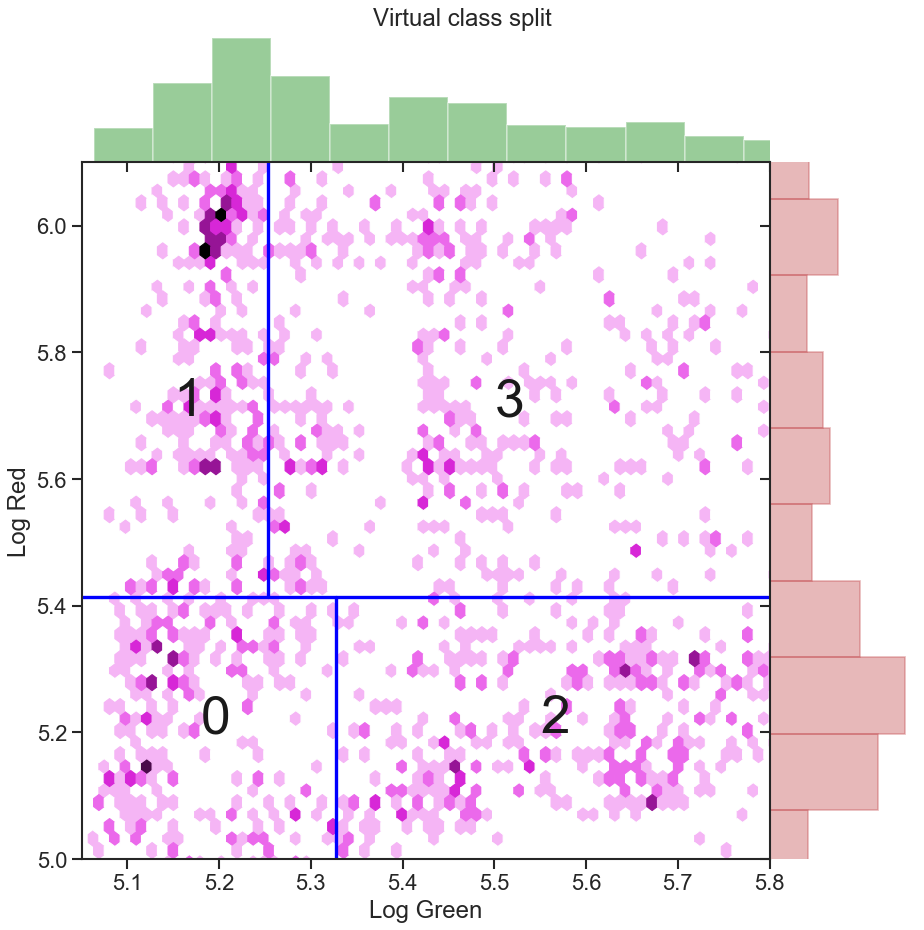

In [33]:
import seaborn as sns; sns.set(style="ticks", color_codes=True)
sns.set_context("talk", font_scale=1.2, rc={"lines.linewidth": 3.0})
g = sns.jointplot(x="Log Green", y="Log Red", 
                  data=pd.DataFrame(data={"Log Green": labels[flt][:, 1], "Log Red": labels[flt][:, 0]}),
                 xlim=(5.05, 5.8), ylim=(5, 6.1),
                 color="violet",
                 space=0,
                 kind="hex",
                 height=12,
                 ratio=5,
                 joint_kws={"gridsize": 150},
                 marginal_kws={'color': 'green'})
_ = plt.setp(g.ax_marg_y.patches, color="r")
df2 = pd.DataFrame(data={"x": [5.05, 5.8], "y": [np.log(224.432), np.log(224.432)]})
g.x = df2.x
g.y = df2.y
g.plot_joint(plt.plot, linestyle="-", linewidth=3, alpha=1.0, c="blue")
df2 = pd.DataFrame(data={"x": [np.log(205.802), np.log(205.802)], "y": [5, np.log(224.432)]})
g.x = df2.x
g.y = df2.y
g.plot_joint(plt.plot, linestyle="-", linewidth=3, alpha=1.0, c="blue")
df2 = pd.DataFrame(data={"x": [np.log(191.104), np.log(191.104)], "y": [np.log(224.432), 6.1]})
g.x = df2.x
g.y = df2.y
g.plot_joint(plt.plot, linestyle="-", linewidth=3, alpha=1.0, c="blue")
plt.gca().annotate("0", [5.18, 5.2], fontsize=48, color="k")
plt.gca().annotate("1", [5.15, 5.7], fontsize=48, color="k")
plt.gca().annotate("2", [5.55, 5.2], fontsize=48, color="k")
plt.gca().annotate("3", [5.5, 5.7], fontsize=48, color="k")
_ = g.fig.suptitle('Virtual class split')

In [17]:
metric = "correlation"
embeddings_preds = umap_transform(x[flt], n_neighbors=30, min_dist=0.05, n_components=2, metric=metric)

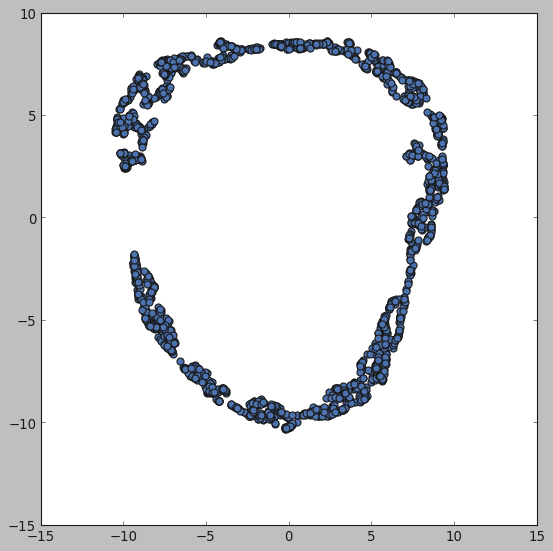

In [18]:
fig = plt.figure(figsize=(8, 8))
umap_plot(embeddings_preds, None, n_components=2, title="", colorbar=False, alpha=1, cmap=None, linewidths=1)


In [127]:
steps = 100
intervals = np.digitize(angle, np.linspace (0, 360, steps))
intensities = []
moving = 5
for i in range(1, steps):
    if i - moving < 1:
        rng = np.logical_or(steps - 1 + (i - moving) <= intervals, intervals <= i + moving)
    elif i + moving > steps - 1:
        rng = np.logical_or(i - moving <= intervals, intervals <= (i + moving) - steps + 1)
    else:
        rng = np.logical_and(i - moving <= intervals, intervals <= i + moving)
    intensities.append(labels[flt][rng].mean(axis=0))
intensities = np.array(intensities)
lo = np.percentile(intensities, 0, axis=0)
hi = np.percentile(intensities, 100, axis=0)
intensities = (intensities - lo) / (hi - lo)

NameError: name 'flt' is not defined

In [25]:
intervals.shape

(2157,)

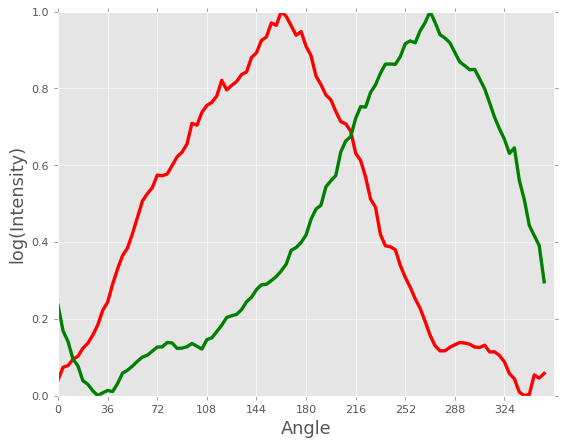

In [32]:
plt.style.use('ggplot')
plt.plot(intensities[:, 0], c="red", linewidth=3)
plt.plot(intensities[:, 1], c="green", linewidth=3)
plt.ylabel("log(Intensity)", fontsize=16)
plt.xlabel("Angle", fontsize=16)
_ = plt.xticks(range(steps + 1)[::10], np.arange(0, 361, 36))

Text(0,0.5,'Normalized Red intensity')

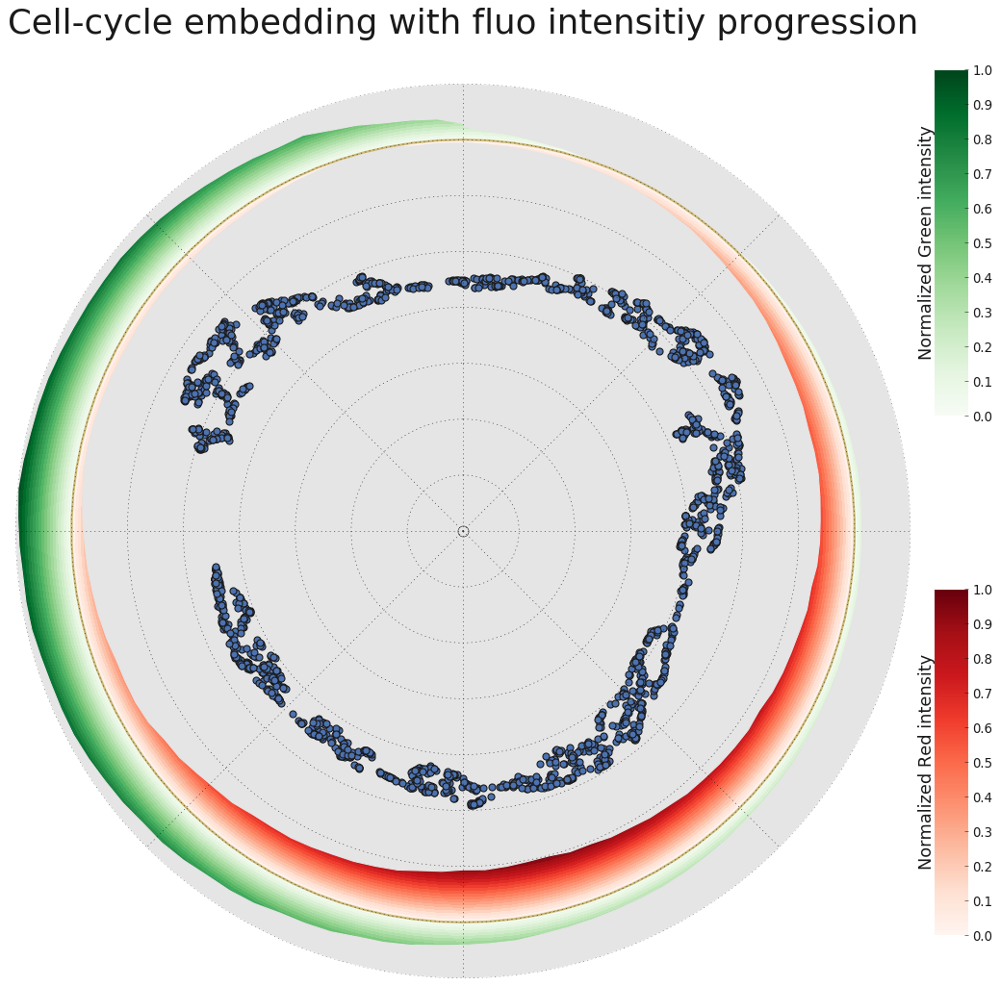

In [31]:
from matplotlib import colors, cm
import matplotlib as mpl
style = '_classic_test'
plt.style.use(style)
plt.style.library[style]['axes.facecolor'] = '#E5E5E5'
plt.style.library[style]['axes.edgecolor'] = 'white'
plt.style.library[style]['figure.facecolor'] = 'white'

def radial_grad(data, num_bars, color_map, invert=False, add_contour=True, background_color="c"):
    min_y, max_y = min(data), max(data)
    y = np.linspace(min_y, max_y, num_bars)
    z = np.meshgrid(x, y)[1]

    cs = ax.contourf(x, y, z, num_bars, cmap=plt.get_cmap(color_map))
    if add_contour:
        plt.plot(x, data)
    plt.fill_between(x, data, y2=min_y - 0.1 if invert else max_y + 0.1, color=background_color)

num_bars = 20
steps = 99
centerline, magnitude = 14, 2
x = np.linspace(0, 2 * np.pi, steps)
data1 = centerline + intensities[:, 1] * magnitude
data2 = centerline - intensities[:, 0] * magnitude

fig, ax = plt.subplots(subplot_kw=dict(projection='polar'), figsize=(15, 15))
ax.scatter(angle / 360 * 2 * np.pi, np.sqrt((np.square(s_) / (1, 1)).sum(1)), s=40, c=None, alpha=1, linewidths=1)

background_color = plt.style.library[style]['axes.facecolor']
radial_grad(data1, num_bars, "Greens", add_contour=False, background_color=background_color)
radial_grad(data2, num_bars, "Reds_r", add_contour=False, invert=True, background_color=background_color)

ax.plot(x, np.ones(steps) * centerline, color='y', lw=2, linestyle='-')
ax.plot(0, 0, "o", markersize=10, color="black", mfc="none")

ax.plot(np.linspace(20 / 180 * np.pi, 90 / 180 * np.pi, steps), np.ones(steps) * 25, color='yellow', lw=20, linestyle='-')
marker_style = dict(linestyle=':', color='1.0', markersize=50, mfc="yellow", mec="yellow", fillstyle="full")
plt.plot(90 / 180 * np.pi, 25, marker="v", **marker_style)

plt.ylim(0, max(data1))
plt.title('Cell-cycle embedding with fluo intensitiy progression', fontsize=32)

# ax.grid(True)
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_theta_zero_location('N')
ax.set_theta_direction(-1)

ax = fig.add_axes([0.92, 0.6, 0.03, 0.3])
cbar = mpl.colorbar.ColorbarBase(ax, cmap=plt.get_cmap("Greens"))
cbar.ax.get_yaxis().labelpad = -70
cbar.ax.set_ylabel('Normalized Green intensity', rotation=90, size=16)
ax = fig.add_axes([0.92, 0.15, 0.03, 0.3])
cbar = mpl.colorbar.ColorbarBase(ax, cmap=plt.get_cmap("Reds"))
cbar.ax.get_yaxis().labelpad = -70
cbar.ax.set_ylabel('Normalized Red intensity', rotation=90, size=16)

In [83]:
plt.style.library['ggplot']

RcParams({'axes.axisbelow': True,
          'axes.edgecolor': 'white',
          'axes.facecolor': '#E5E5E5',
          'axes.grid': True,
          'axes.labelcolor': '#555555',
          'axes.labelsize': 'large',
          'axes.linewidth': 1.0,
          'axes.prop_cycle': cycler('color', ['#E24A33', '#348ABD', '#988ED5', '#777777', '#FBC15E', '#8EBA42', '#FFB5B8']),
          'axes.titlesize': 'x-large',
          'figure.edgecolor': '0.50',
          'figure.facecolor': 'white',
          'font.size': 10.0,
          'grid.color': 'white',
          'grid.linestyle': '-',
          'patch.antialiased': True,
          'patch.edgecolor': '#EEEEEE',
          'patch.facecolor': '#348ABD',
          'patch.linewidth': 0.5,
          'xtick.color': '#555555',
          'xtick.direction': 'out',
          'ytick.color': '#555555',
          'ytick.direction': 'out'})

Text(0.5,0.98,'U-Map embedded trajectory re-mapped back onto fluo plane')

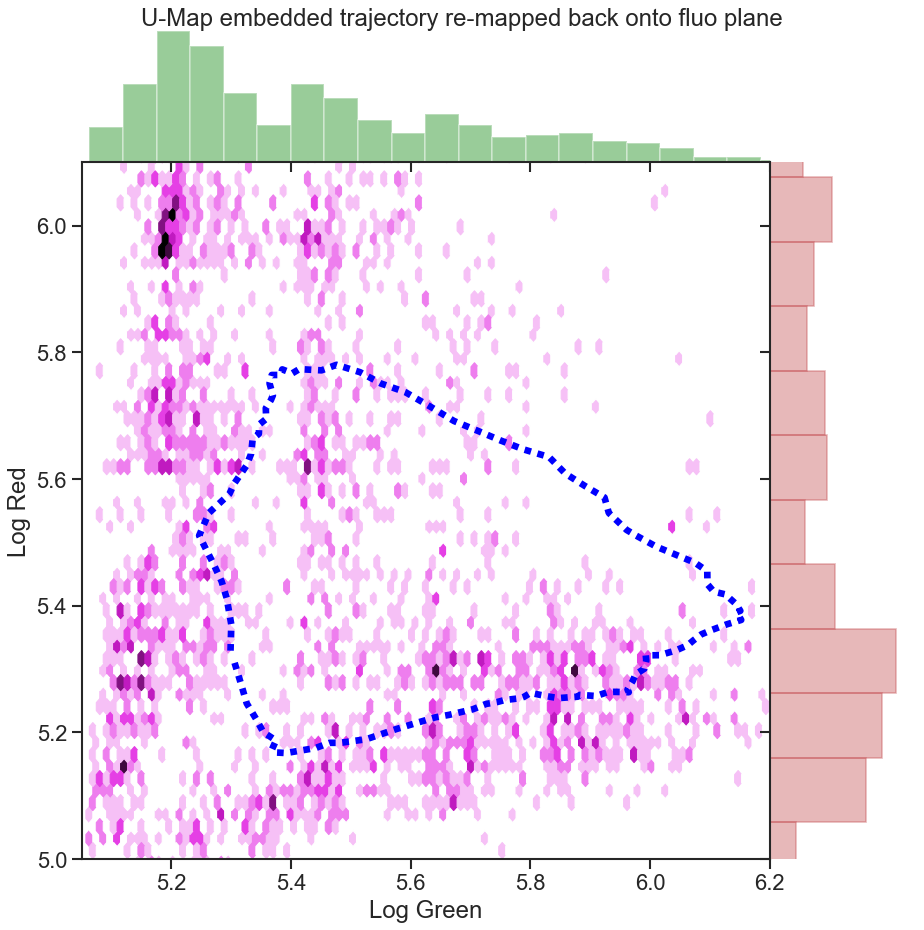

In [59]:
import seaborn as sns; sns.set(style="ticks", color_codes=True)
raw_intensities = intensities * (hi - lo) + lo
sns.set_context("talk", font_scale=1.2, rc={"lines.linewidth": 3.0})
g = sns.jointplot(x="Log Green", y="Log Red", 
                  data=pd.DataFrame(data={"Log Green": labels[flt][:, 1], "Log Red": labels[flt][:, 0]}),
                 xlim=(5.05, 6.2), ylim=(5, 6.1),
                 color="violet",
                 space=0,
                 kind="hex",
                 height=12,
                 ratio=5,
                 joint_kws={"gridsize": 150},
                 marginal_kws={'color': 'green'})
plt.setp(g.ax_marg_y.patches, color="r")
df2 = pd.DataFrame(data={"x": raw_intensities[:, 0], "y": raw_intensities[:, 1]})
g.x = df2.x
g.y = df2.y
g.plot_joint(plt.plot, linestyle="--", linewidth=6, alpha=1.0, c="blue")
g.fig.suptitle('U-Map embedded trajectory re-mapped back onto fluo plane')

In [677]:
df = pd.read_csv("data/20180910_Timelapse/intensities.csv", header=[0, 1, 2])
curated_tracks = sorted(pd.read_csv("data/20180910_Timelapse/curated_tracks.csv", header=None).values.flatten())

C:\Anaconda3\lib\site-packages\ipykernel\kernelbase.py:399: PerformanceWarning: indexing past lexsort depth may impact performance.
  user_expressions, allow_stdin)


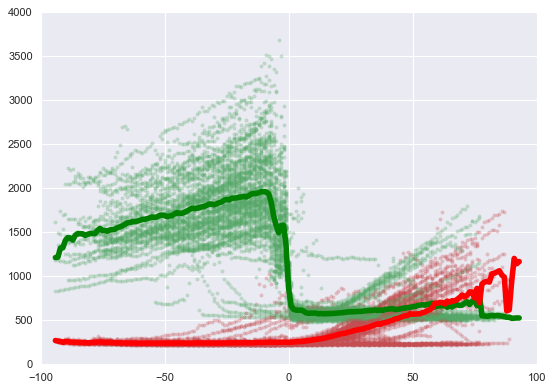

In [679]:
w = np.zeros(200)
g = np.zeros(200)
r = np.zeros(200)

g_mean, r_mean = df[["green_mean", "red_mean"]].T.values

for t in curated_tracks:
    x, y_g, y_r = df[(str(t), "time")].values.flatten(), df[(str(t), "green", "median")].values, df[(str(t), "red", "median")].values
#     y_g -= g_mean #- 110
#     y_r -= r_mean #- 200
    plt.plot(x, y_g, "g.", x, y_r, "r.", alpha=0.3)
    
    flt = ~np.isnan(x)
    mask = x[flt].astype(int) + 100
    w[mask] += 1
    g[mask] += y_g[flt]
    r[mask] += y_r[flt]

xm = np.arange(-100, 100)[w > 0]
g = g[w > 0] / w[w > 0]
r = r[w > 0] / w[w > 0]
plt.plot(xm, g, "green", xm, r, "red", linewidth=5)

Text(0.5,0,'Log Green')

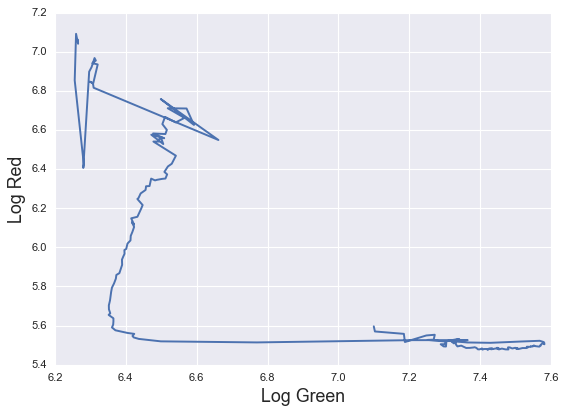

In [680]:
plt.plot(np.log(g), np.log(r))
plt.ylabel("Log Red", fontsize=16)
plt.xlabel("Log Green", fontsize=16)

In [947]:
dfc = df[(df[("frame_num",)] == 50).values]
x = dfc.loc[:, dfc.columns.get_level_values(1).isin(["x", "y"])].values.reshape(-1, 2) # [:, 2] coords
x2 = np.sum(x * x, 1, keepdims=True) # [:, 1] x^2
sp_dist = np.sqrt(x2 + x2.T - 2 * np.dot(x, x.T))
time = dfc.loc[:, dfc.columns.get_level_values(1)=="time"].values
tm_dist = np.abs(time - time.T)

tm = sp_dist[np.tril_indices(len(sp_dist), k=-1)]
sp = tm_dist[np.tril_indices(len(tm_dist), k=-1)]

C:\Anaconda3\lib\site-packages\ipykernel\kernelbase.py:399: PerformanceWarning: indexing past lexsort depth may impact performance.
  user_expressions, allow_stdin)


In [3]:
from itertools import islice
df = pd.read_csv("data/20180910_Timelapse/intensities.csv", header=[0, 1, 2])

tm = []
sp = []
for i, row in islice(df.iterrows(), 0, None):
    x = row[row.index.get_level_values(1).isin(["x", "y"])].values.reshape(-1, 2) # [:, 2] coords
    x2 = np.sum(x * x, 1, keepdims=True) # [:, 1] x^2
    sp_dist = np.sqrt(x2 + x2.T - 2 * np.dot(x, x.T))
    time = row[row.index.get_level_values(1)=="time"].values.reshape(-1, 1)
    tm_dist = np.abs(time - time.T)

    sp.append(sp_dist[np.tril_indices(len(sp_dist), k=-1)])
    tm.append(tm_dist[np.tril_indices(len(tm_dist), k=-1)])
    
tm = np.concatenate(tm)
sp = np.concatenate(sp)
idx = ~np.isnan(tm)
tm = tm[idx]
sp = sp[idx]

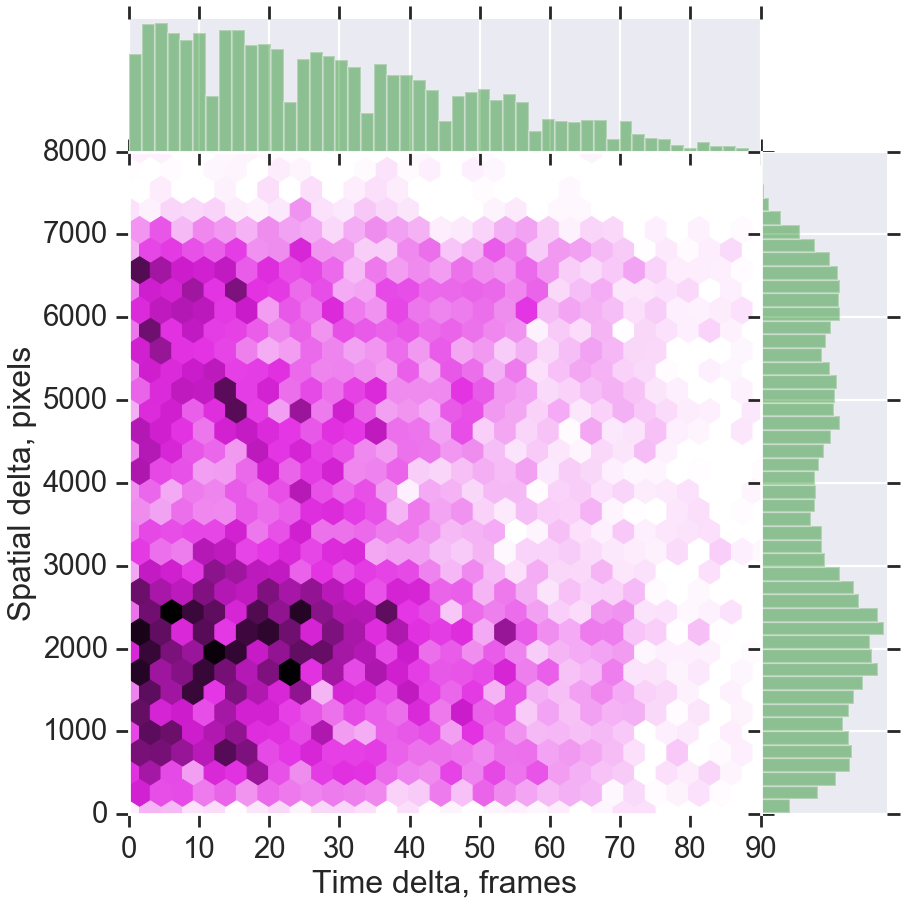

In [1004]:
sns.set_context("poster", font_scale=1.2, rc={"lines.linewidth": 3.0})
g = sns.jointplot(x="Time delta, frames", y="Spatial delta, pixels",
                  data=pd.DataFrame(data={"Time delta, frames": tm, "Spatial delta, pixels": sp}),
                  xlim=(0, 90), ylim=(0, 8000),
                  color="violet",
                  space=0,
                  kind="hex",
                  height=12,
                  ratio=5,
                  joint_kws={"gridsize": 30},
                  marginal_kws={'color': 'green'})

In [19]:
from scipy.stats.stats import pearsonr, spearmanr
prs = pearsonr(sp, tm)
spr = spearmanr(sp, tm)
print(f'Pearson correlation={prs[0]}, p-value={prs[1]}')
print(f'Spearman correlation={spr.correlation}, p-value={spr.pvalue}')

Pearson correlation=0.008709152059404902, p-value=1.5387742660320513e-12
Spearman correlation=0.0031414594764908824, p-value=0.010756704495920607


In [33]:
idx = sp < 100
print(f'Take only {sum(idx)} cells ({sum(idx) / len(idx) * 100:0.2f}% of data)')
prs = pearsonr(sp[idx], tm[idx])
spr = spearmanr(sp[idx], tm[idx])
print(f'Pearson correlation={prs[0]}, p-value={prs[1]}')
print(f'Spearman correlation={spr.correlation}, p-value={spr.pvalue}')

Take only 1946 cells (0.30% of data)
Pearson correlation=-0.1702956181494457, p-value=3.944470641553742e-14
Spearman correlation=-0.16460174637720007, p-value=2.744348777401901e-13


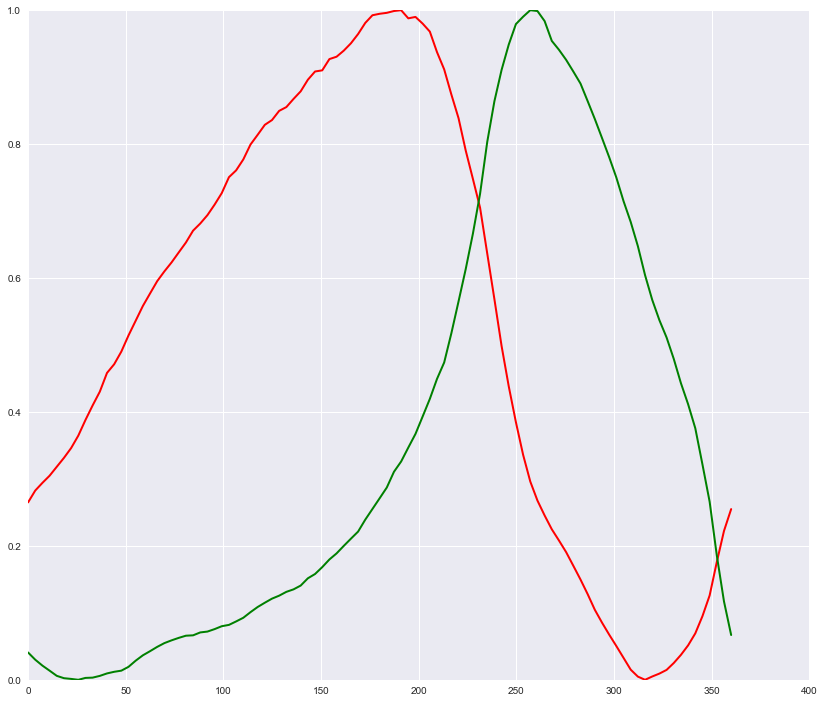

In [19]:
fig, ax1 = plt.subplots(figsize=(14, 12))
x = np.linspace(0, 360, steps - 1)
ax1.plot(x, intensities[:, 0], c="red", linewidth=linewidth)
ax1.plot(x, intensities[:, 1], c="green", linewidth=linewidth)

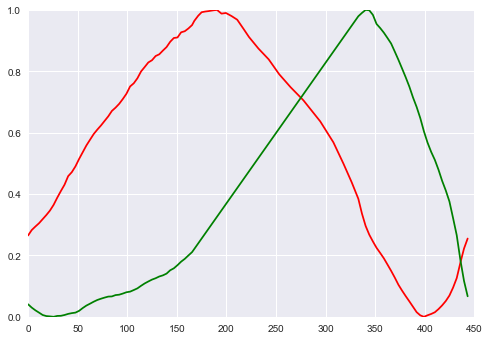

In [74]:
begin, end = 45, 69 # 52 -> 70
extension = 170

new_x = x.copy()
r = (intensities[begin: end, 1] - intensities[begin, 1]) / (intensities[end, 1] - intensities[begin, 1])
new_x[begin: end] = extension * r + new_x[begin]
new_x[end:] += new_x[end - 1] - x[end - 1]
plt.plot(new_x, intensities[:, 0], 'r')
plt.plot(new_x, intensities[:, 1], 'g')


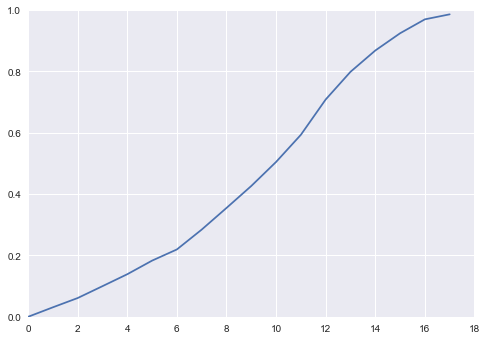

In [52]:
plt.plot((intensities[begin: end, 1] - intensities[begin, 1]) / (intensities[end, 1] - intensities[begin, 1]))